In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [2]:
rains = pd.read_csv('../data/weatherAUS.csv')
rains['Date'] = pd.to_datetime(rains['Date'])
rains['Year'] = rains['Date'].dt.year
rains['Month'] = rains['Date'].dt.month


In [3]:
rains.dropna(subset=['RainTomorrow'], inplace=True)
assert(len(rains[rains['RainTomorrow'].isnull()]) == 0)

rains_x = rains.drop(columns=['RainTomorrow'])  
rains_y = rains['RainTomorrow'] 

X_train, rains_test, y_train, rain_tomorrow_test = train_test_split(
    rains_x, rains_y, 
    test_size=0.2,  
    stratify=rains_y,
    random_state=42
)
X_train["RainTomorrow"] = y_train
rains = X_train



In [4]:
city_coords = {
    'Albury': (-36.0785, 146.9136),
    'BadgerysCreek': (-33.8813, 150.7282),
    'Cobar': (-31.8667, 145.7667),
    'CoffsHarbour': (-30.3026, 153.1137),
    'Moree': (-29.4706, 149.8392),
    'Newcastle': (-32.9283, 151.7817),
    'NorahHead': (-33.2202, 151.5433),
    'NorfolkIsland': (-29.0408, 167.9541),
    'Penrith': (-33.7675, 150.6931),
    'Richmond': (-33.5982, 150.7581),
    'Sydney': (-33.8688, 151.2093),
    'SydneyAirport': (-33.9399, 151.1753),
    'WaggaWagga': (-35.0433, 147.3587),
    'Williamtown': (-32.7951, 151.8118),
    'Wollongong': (-34.4278, 150.8931),
    'Canberra': (-35.2809, 149.1300),
    'Tuggeranong': (-35.4167, 149.1000),
    'MountGinini': (-35.4471, 148.9685),
    'Ballarat': (-37.5622, 143.8503),
    'Bendigo': (-36.7582, 144.2814),
    'Sale': (-38.1100, 147.0737),
    'MelbourneAirport': (-37.6692, 144.8411),
    'Melbourne': (-37.8136, 144.9631),
    'Mildura': (-34.1850, 142.1625),
    'Nhil': (-35.2060, 141.6450),
    'Portland': (-38.3516, 141.5878),
    'Watsonia': (-37.7139, 145.0875),
    'Dartmoor': (-37.7251, 141.2843),
    'Brisbane': (-27.4698, 153.0251),
    'Cairns': (-16.9203, 145.7710),
    'GoldCoast': (-28.0167, 153.4000),
    'Townsville': (-19.2589, 146.8183),
    'Adelaide': (-34.9285, 138.6007),
    'MountGambier': (-37.8321, 140.7807),
    'Nuriootpa': (-34.4973, 138.9966),
    'Woomera': (-31.1395, 136.7984),
    'Albany': (-35.0285, 117.8837),
    'Witchcliffe': (-33.7015, 115.0911),
    'PearceRAAF': (-31.9131, 115.9741),
    'PerthAirport': (-31.9402, 115.9676),
    'Perth': (-31.9505, 115.8605),
    'SalmonGums': (-33.3937, 121.2060),
    'Walpole': (-34.9639, 115.8106),
    'Hobart': (-42.8821, 147.3272),
    'Launceston': (-41.4391, 147.1349),
    'AliceSprings': (-23.6980, 133.8807),
    'Darwin': (-12.4634, 130.8456),
    'Katherine': (-14.4686, 132.2678),
    'Uluru': (-25.3444, 131.0369)
}

# Columnas 
Se identifican las siguientes columnas:
Columnas del Conjunto de Datos "Rain in Australia":

- **Date (Fecha):**
  - **Descripción**: La fecha de la observación meteorológica.
  - **Formato**: `YYYY-MM-DD` (Año-Mes-Día).
  - **Ejemplo**: `2008-12-01`.

- **Location (Ubicación):**
  - **Descripción**: La estación meteorológica donde se registró la observación.
  - **Valores**: Varias ubicaciones en Australia, como:
    - Albury
    - Coffs Harbour
    - Mildura
    - Sydney Airport
  - **Ejemplo**: `Albury`.

- **MinTemp (Temperatura Mínima):**
  - **Descripción**: La temperatura mínima (en grados Celsius) registrada durante el día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `14.2`.

- **MaxTemp (Temperatura Máxima):**
  - **Descripción**: La temperatura máxima (en grados Celsius) registrada durante el día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `28.1`.

- **Rainfall (Precipitación):**
  - **Descripción**: La cantidad de precipitación (en milímetros) registrada durante el día. Si no hubo lluvia, este valor será cero.
  - **Unidad**: mm (milímetros).
  - **Ejemplo**: `5.0`.

- **Evaporation (Evaporación):**
  - **Descripción**: La cantidad de evaporación (en milímetros) registrada durante el día. Mide la pérdida de agua de la superficie debido a la evaporación.
  - **Unidad**: mm (milímetros).
  - **Ejemplo**: `6.2`.

- **Sunshine (Horas de Sol):**
  - **Descripción**: La cantidad de horas de sol registradas durante el día.
  - **Unidad**: Horas.
  - **Ejemplo**: `7.4`.

- **WindGustDir (Dirección del Mayor Ráfaga de Viento):**
  - **Descripción**: La dirección de la ráfaga de viento más fuerte registrada durante el día.
  - **Valores**: Direcciones como `N` (Norte), `E` (Este), `S` (Sur), `O` (Oeste), y direcciones intermedias como `NE` (Noreste), `SE` (Sureste), etc.
  - **Ejemplo**: `E` (Este).

- **WindGustSpeed (Velocidad del Mayor Ráfaga de Viento):**
  - **Descripción**: La velocidad (en kilómetros por hora) de la ráfaga de viento más fuerte registrada durante el día.
  - **Unidad**: km/h (kilómetros por hora).
  - **Ejemplo**: `39`.

- **WindDir9am (Dirección del Viento a las 9 AM):**
  - **Descripción**: La dirección del viento a las 9 AM del día.
  - **Valores**: Mismas posibles direcciones que `WindGustDir`.
  - **Ejemplo**: `NE` (Noreste).

- **WindSpeed9am (Velocidad del Viento a las 9 AM):**
  - **Descripción**: La velocidad media del viento (en kilómetros por hora) a las 9 AM del día.
  - **Unidad**: km/h (kilómetros por hora).
  - **Ejemplo**: `6`.

- **Humidity9am (Humedad Relativa a las 9 AM):**
  - **Descripción**: La humedad relativa (en porcentaje) a las 9 AM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `65`.

- **Humidity3pm (Humedad Relativa a las 3 PM):**
  - **Descripción**: La humedad relativa (en porcentaje) a las 3 PM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `45`.

- **Pressure9am (Presión Atmosférica a las 9 AM):**
  - **Descripción**: La presión atmosférica (en hectopascales, hPa) a las 9 AM.
  - **Unidad**: hPa (hectopascales).
  - **Ejemplo**: `1013.5`.

- **Pressure3pm (Presión Atmosférica a las 3 PM):**
  - **Descripción**: La presión atmosférica (en hectopascales, hPa) a las 3 PM.
  - **Unidad**: hPa (hectopascales).
  - **Ejemplo**: `1012.1`.

- **Cloud9am (Nubes a las 9 AM):**
  - **Descripción**: El porcentaje de nubes a las 9 AM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `40`.

- **Cloud3pm (Nubes a las 3 PM):**
  - **Descripción**: El porcentaje de nubes a las 3 PM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `50`.

- **Temp9am (Temperatura a las 9 AM):**
  - **Descripción**: La temperatura (en grados Celsius) a las 9 AM del día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `16.0`.

- **Temp3pm (Temperatura a las 3 PM):**
  - **Descripción**: La temperatura (en grados Celsius) a las 3 PM del día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `25.0`.

- **RainTomorrow (Lluvia Mañana):**
  - **Descripción**: Variable objetivo que indica si lloverá mañana.
  - **Valores**:
    - `Yes`: Lloverá mañana.
    - `No`: No lloverá mañana.
  - **Ejemplo**: `Yes`.
La mayoría de las columnas son numéricas (temperaturas, precipitación, etc.), pero algunas columnas como las direcciones del viento y la lluvia de mañana son categóricas. Esto puede ser útil al preparar los datos para modelos de clasificación.

## Valores Faltantes
 El conjunto de datos puede tener valores faltantes (NaNs), especialmente en columnas como evaporación, velocidad del viento y nubosidad. Algunos registros pueden tener datos incompletos, lo que requiere un procesamiento previo para modelos de aprendizaje automático.


# Columnas 
Se identifican las siguientes columnas:
Columnas del Conjunto de Datos "Rain in Australia":

- **Date (Fecha):**
  - **Descripción**: La fecha de la observación meteorológica.
  - **Formato**: `YYYY-MM-DD` (Año-Mes-Día).
  - **Ejemplo**: `2008-12-01`.

- **Location (Ubicación):**
  - **Descripción**: La estación meteorológica donde se registró la observación.
  - **Valores**: Varias ubicaciones en Australia, como:
    - Albury
    - Coffs Harbour
    - Mildura
    - Sydney Airport
  - **Ejemplo**: `Albury`.

- **MinTemp (Temperatura Mínima):**
  - **Descripción**: La temperatura mínima (en grados Celsius) registrada durante el día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `14.2`.

- **MaxTemp (Temperatura Máxima):**
  - **Descripción**: La temperatura máxima (en grados Celsius) registrada durante el día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `28.1`.

- **Rainfall (Precipitación):**
  - **Descripción**: La cantidad de precipitación (en milímetros) registrada durante el día. Si no hubo lluvia, este valor será cero.
  - **Unidad**: mm (milímetros).
  - **Ejemplo**: `5.0`.

- **Evaporation (Evaporación):**
  - **Descripción**: La cantidad de evaporación (en milímetros) registrada durante el día. Mide la pérdida de agua de la superficie debido a la evaporación.
  - **Unidad**: mm (milímetros).
  - **Ejemplo**: `6.2`.

- **Sunshine (Horas de Sol):**
  - **Descripción**: La cantidad de horas de sol registradas durante el día.
  - **Unidad**: Horas.
  - **Ejemplo**: `7.4`.

- **WindGustDir (Dirección del Mayor Ráfaga de Viento):**
  - **Descripción**: La dirección de la ráfaga de viento más fuerte registrada durante el día.
  - **Valores**: Direcciones como `N` (Norte), `E` (Este), `S` (Sur), `O` (Oeste), y direcciones intermedias como `NE` (Noreste), `SE` (Sureste), etc.
  - **Ejemplo**: `E` (Este).

- **WindGustSpeed (Velocidad del Mayor Ráfaga de Viento):**
  - **Descripción**: La velocidad (en kilómetros por hora) de la ráfaga de viento más fuerte registrada durante el día.
  - **Unidad**: km/h (kilómetros por hora).
  - **Ejemplo**: `39`.

- **WindDir9am (Dirección del Viento a las 9 AM):**
  - **Descripción**: La dirección del viento a las 9 AM del día.
  - **Valores**: Mismas posibles direcciones que `WindGustDir`.
  - **Ejemplo**: `NE` (Noreste).

- **WindSpeed9am (Velocidad del Viento a las 9 AM):**
  - **Descripción**: La velocidad media del viento (en kilómetros por hora) a las 9 AM del día.
  - **Unidad**: km/h (kilómetros por hora).
  - **Ejemplo**: `6`.

- **Humidity9am (Humedad Relativa a las 9 AM):**
  - **Descripción**: La humedad relativa (en porcentaje) a las 9 AM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `65`.

- **Humidity3pm (Humedad Relativa a las 3 PM):**
  - **Descripción**: La humedad relativa (en porcentaje) a las 3 PM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `45`.

- **Pressure9am (Presión Atmosférica a las 9 AM):**
  - **Descripción**: La presión atmosférica (en hectopascales, hPa) a las 9 AM.
  - **Unidad**: hPa (hectopascales).
  - **Ejemplo**: `1013.5`.

- **Pressure3pm (Presión Atmosférica a las 3 PM):**
  - **Descripción**: La presión atmosférica (en hectopascales, hPa) a las 3 PM.
  - **Unidad**: hPa (hectopascales).
  - **Ejemplo**: `1012.1`.

- **Cloud9am (Nubes a las 9 AM):**
  - **Descripción**: El porcentaje de nubes a las 9 AM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `40`.

- **Cloud3pm (Nubes a las 3 PM):**
  - **Descripción**: El porcentaje de nubes a las 3 PM del día.
  - **Unidad**: % (porcentaje).
  - **Ejemplo**: `50`.

- **Temp9am (Temperatura a las 9 AM):**
  - **Descripción**: La temperatura (en grados Celsius) a las 9 AM del día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `16.0`.

- **Temp3pm (Temperatura a las 3 PM):**
  - **Descripción**: La temperatura (en grados Celsius) a las 3 PM del día.
  - **Unidad**: °C (grados Celsius).
  - **Ejemplo**: `25.0`.

- **RainTomorrow (Lluvia Mañana):**
  - **Descripción**: Variable objetivo que indica si lloverá mañana.
  - **Valores**:
    - `Yes`: Lloverá mañana.
    - `No`: No lloverá mañana.
  - **Ejemplo**: `Yes`.
La mayoría de las columnas son numéricas (temperaturas, precipitación, etc.), pero algunas columnas como las direcciones del viento y la lluvia de mañana son categóricas. Esto puede ser útil al preparar los datos para modelos de clasificación.

## Valores Faltantes
 El conjunto de datos puede tener valores faltantes (NaNs), especialmente en columnas como evaporación, velocidad del viento y nubosidad. Algunos registros pueden tener datos incompletos, lo que requiere un procesamiento previo para modelos de aprendizaje automático.

# Analysis 

In [5]:
rains.shape

(113754, 25)

In [6]:
rains.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113754 entries, 103642 to 122308
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           113754 non-null  datetime64[ns]
 1   Location       113754 non-null  object        
 2   MinTemp        113241 non-null  float64       
 3   MaxTemp        113496 non-null  float64       
 4   Rainfall       112623 non-null  float64       
 5   Evaporation    65059 non-null   float64       
 6   Sunshine       59410 non-null   float64       
 7   WindGustDir    106269 non-null  object        
 8   WindGustSpeed  106314 non-null  float64       
 9   WindDir9am     105699 non-null  object        
 10  WindDir3pm     110688 non-null  object        
 11  WindSpeed9am   112672 non-null  float64       
 12  WindSpeed3pm   111624 non-null  float64       
 13  Humidity9am    112336 non-null  float64       
 14  Humidity3pm    110857 non-null  float64       
 15  

In [7]:
rains.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month
count,113754,113241.000000,113496.000000,112623.000000,65059.000000,59410.000000,106314.000000,112672.000000,111624.000000,112336.000000,110857.000000,102467.000000,102492.000000,70877.000000,68085.000000,113019.000000,111551.000000,113754.000000,113754.000000
mean,2013-04-01 20:54:33.590379264,12.172898,23.218870,2.360774,5.484554,7.622614,39.953684,13.981885,18.637255,68.838493,51.505227,1017.660456,1015.262716,4.434146,4.502445,16.977363,21.676257,2012.760879,6.407159
min,2007-11-02 00:00:00,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,2007.000000,1.000000
25%,2011-01-06 00:00:00,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.500000,1.000000,2.000000,12.300000,16.600000,2011.000000,3.000000
50%,2013-05-28 00:00:00,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,2013.000000,6.000000
75%,2015-06-14 00:00:00,16.800000,28.200000,0.600000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,2015.000000,9.000000
max,2017-06-25 00:00:00,31.400000,48.100000,371.000000,145.000000,14.300000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.200000,2017.000000,12.000000
std,NaN,6.406406,7.120048,8.544243,4.208367,3.783751,13.571751,8.865721,8.798030,19.053148,20.806658,7.105209,7.036500,2.887667,2.722294,6.499264,6.942100,2.542725,3.422525


Text(0.5, 1.0, 'Correlacion entre todas las variables numericas.')

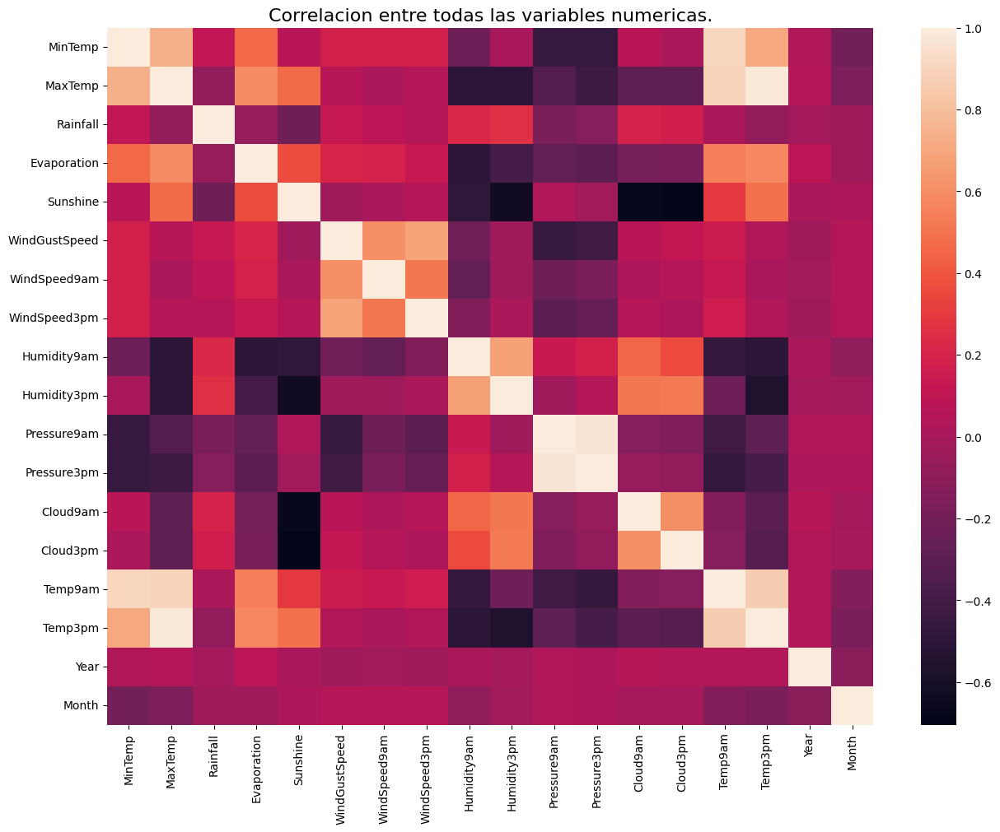

In [95]:
plt.figure(figsize=(15,11))

sns.heatmap(rains.corr(numeric_only=True))
plt.title(f'Correlacion entre todas las variables numericas.', fontsize=16)


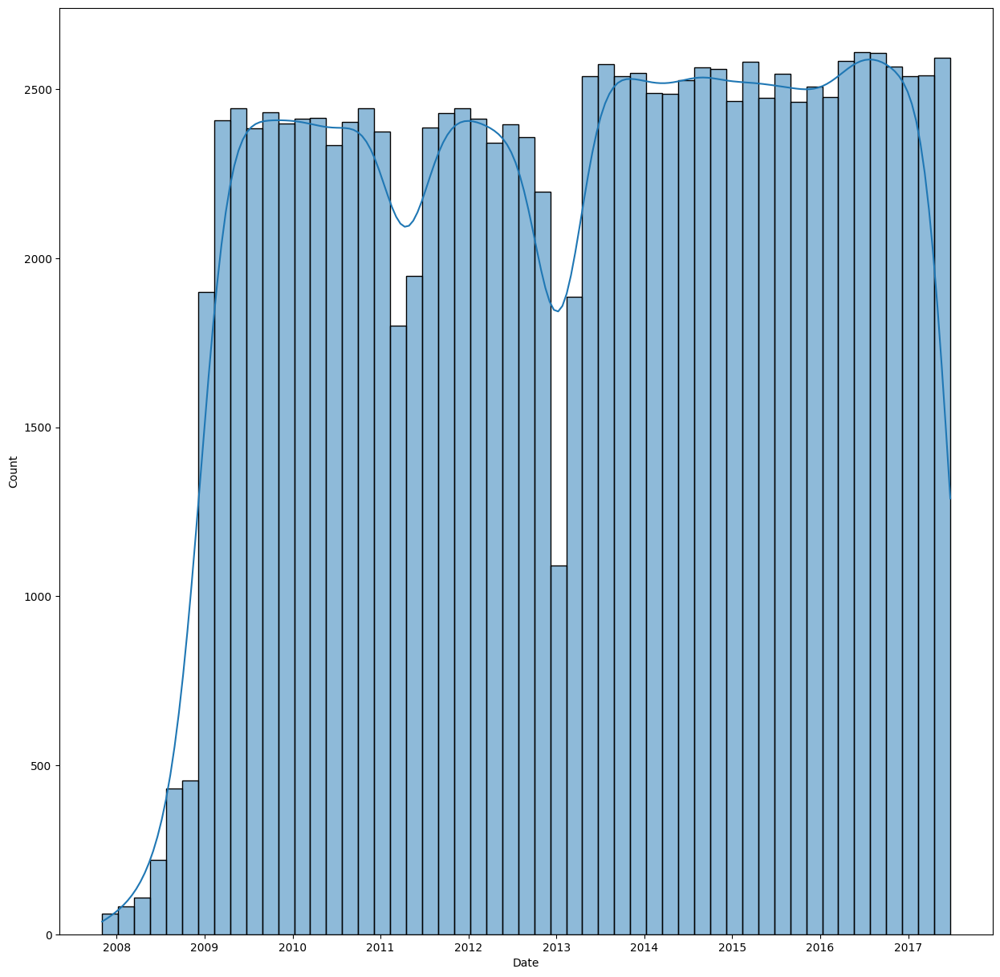

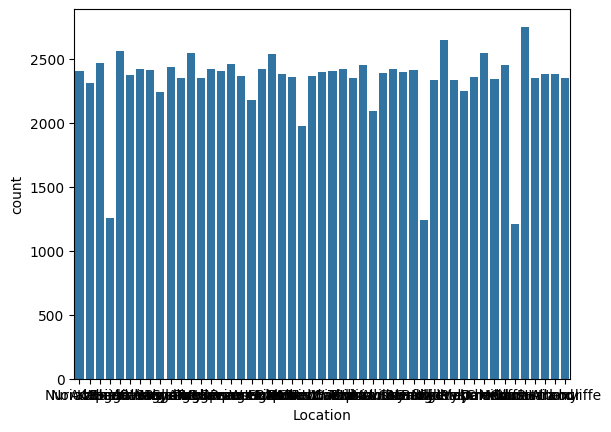

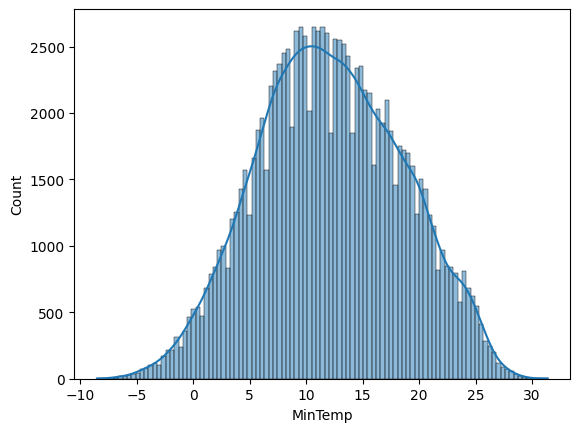

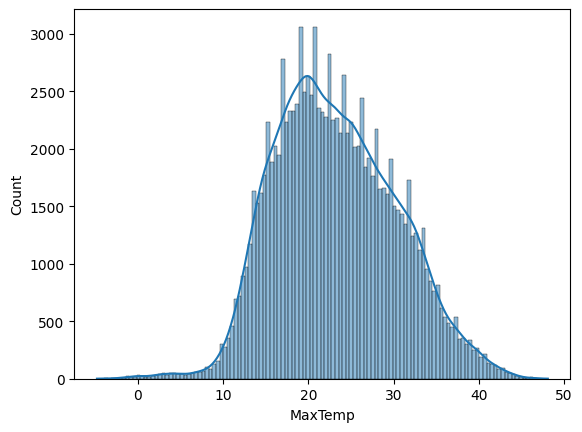

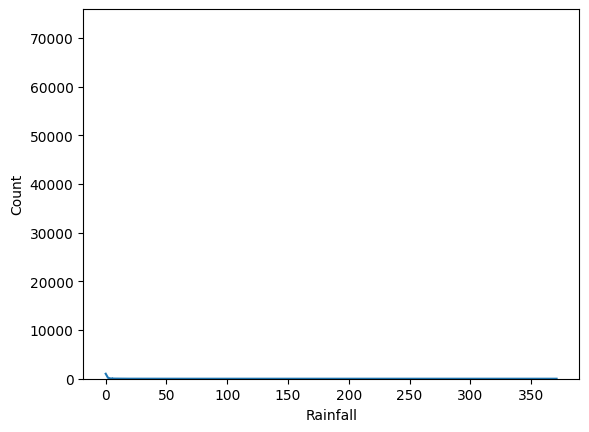

...

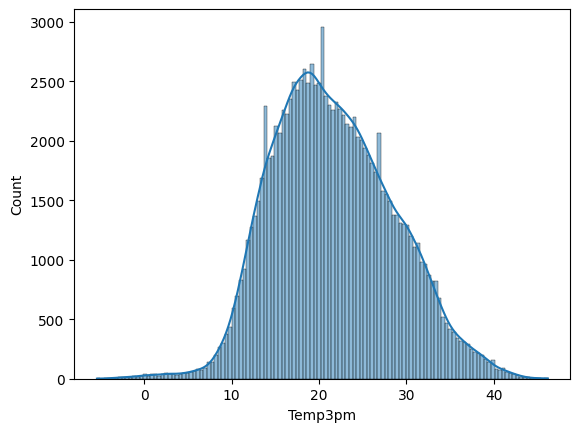

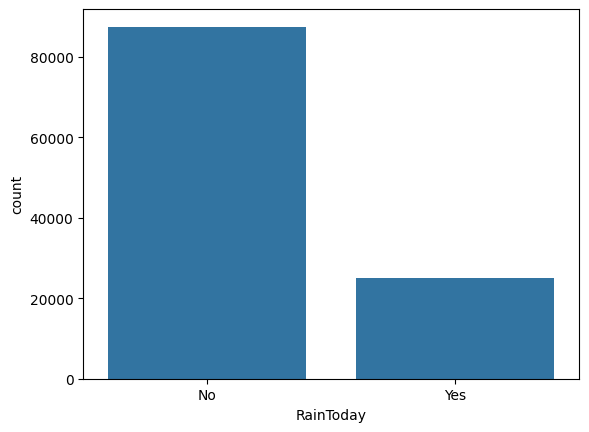

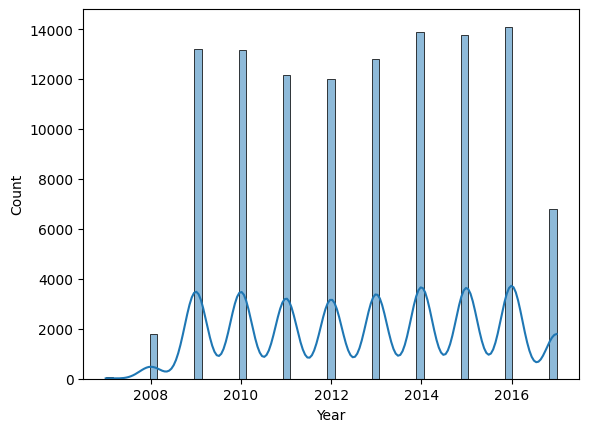

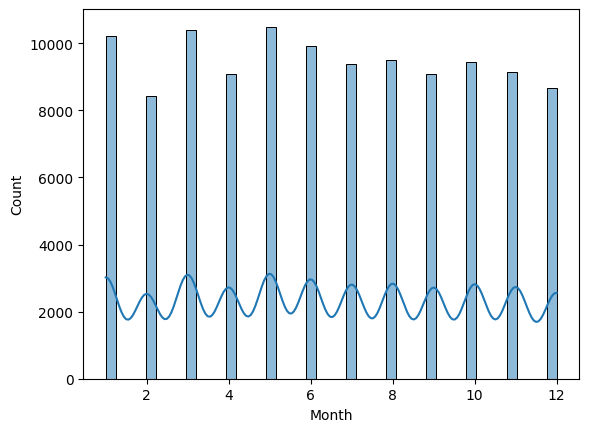

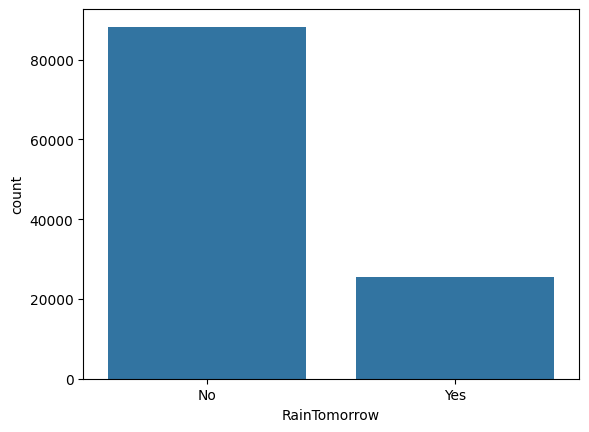

In [9]:
plt.figure(figsize=(15,15))
for column in rains.columns:
    is_cat = rains[column].dtype == 'object'
    if is_cat:
        sns.countplot(rains, x=column)
    else:
        sns.histplot(rains[column], kde=True)
    plt.show()

Text(0.5, 1.0, 'Disparidad de dias de lluvia en Australia 2007-2016')

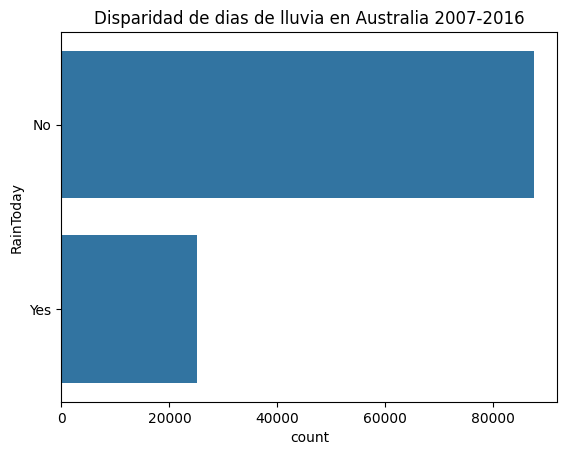

In [10]:
sns.countplot(rains['RainToday'])
plt.title('Disparidad de dias de lluvia en Australia 2007-2016')

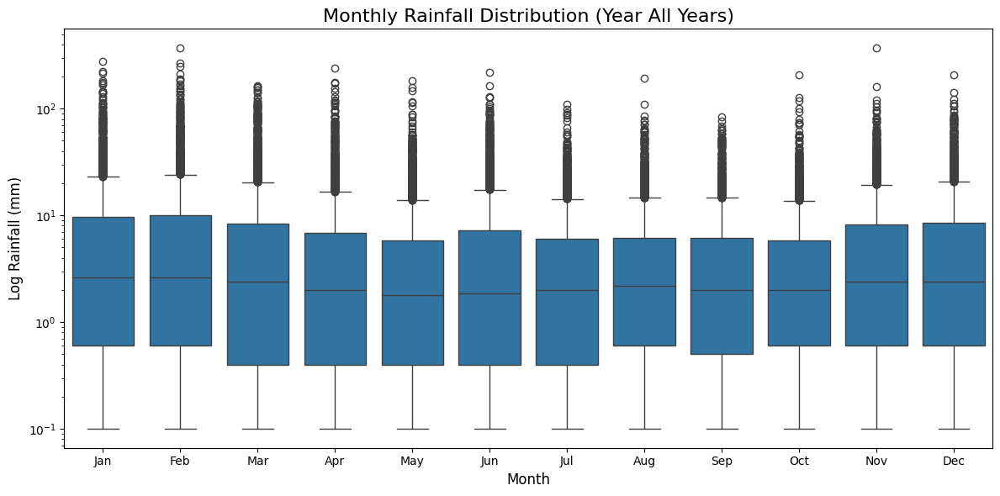

In [11]:
def monthly_rains_box(df, year=None):
    # Create a boxplot of 'Rainfall' by 'Month' for all years
    plt.figure(figsize=(12, 6))
    df_with_rains = df[df['Rainfall'] > 0]
    ax = sns.boxplot(x='Month', y='Rainfall', data=df_with_rains if year is None else df_with_rains[df['Date'].dt.year == year])
    ax.set_yscale('log')

    # Customize the plot
    plt.title(f'Monthly Rainfall Distribution (Year {year if year else "All Years" })', fontsize=16)
    plt.xlabel('Month', fontsize=12)
    plt.ylabel('Log Rainfall (mm)', fontsize=12)
    plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

    # Show the plot
    plt.tight_layout()
    plt.show()

monthly_rains_box(rains)


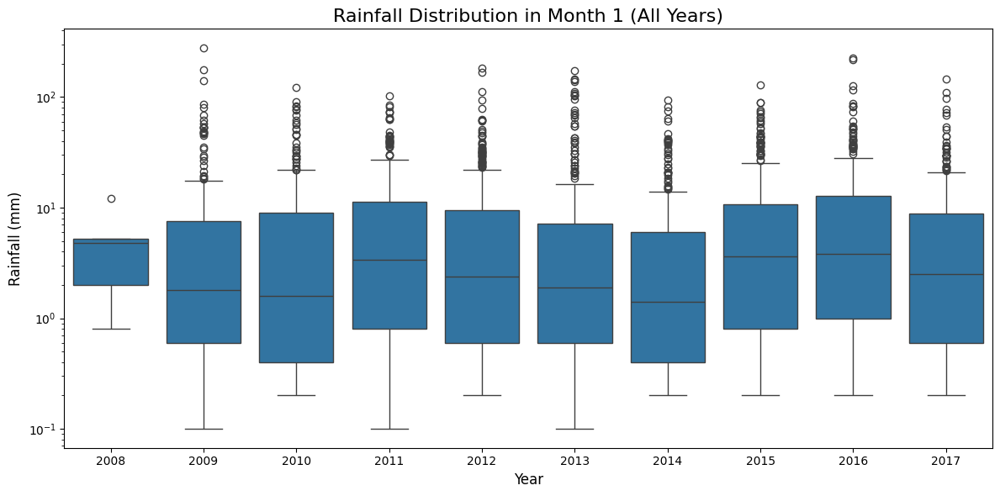

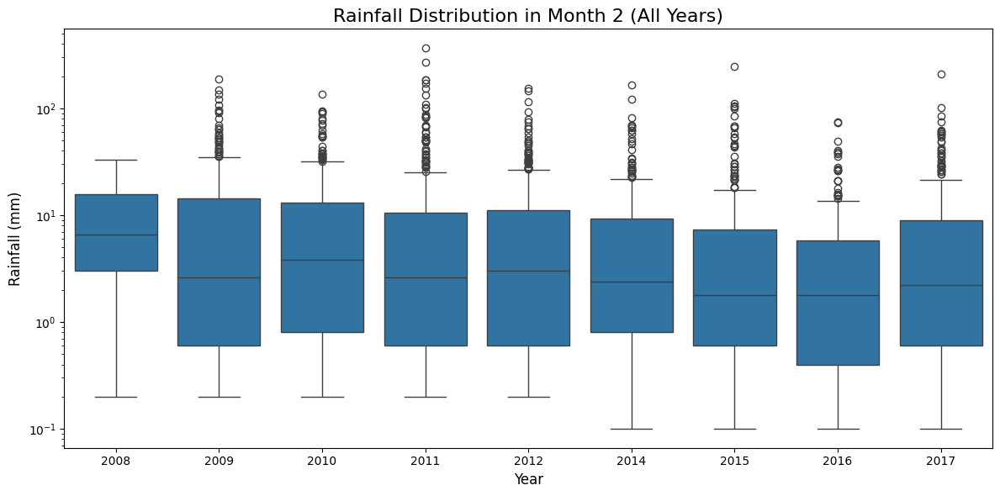

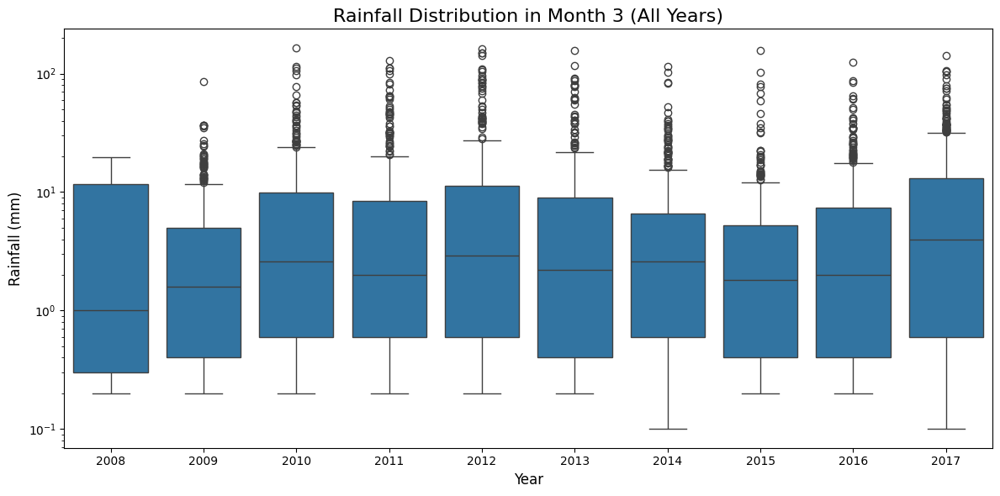

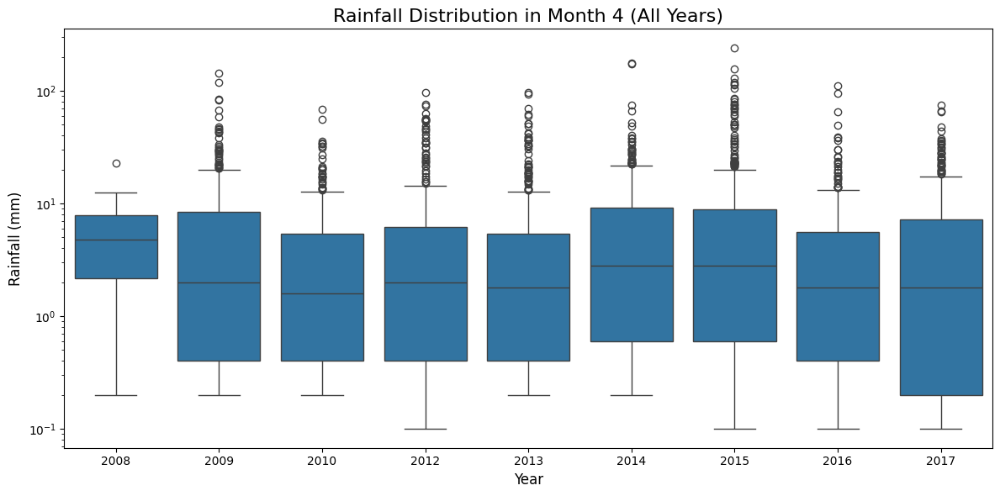

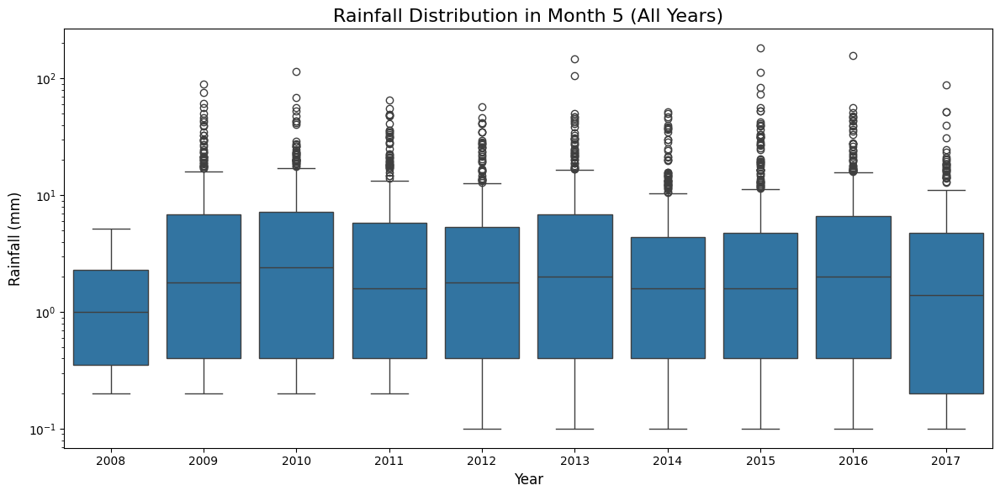

...

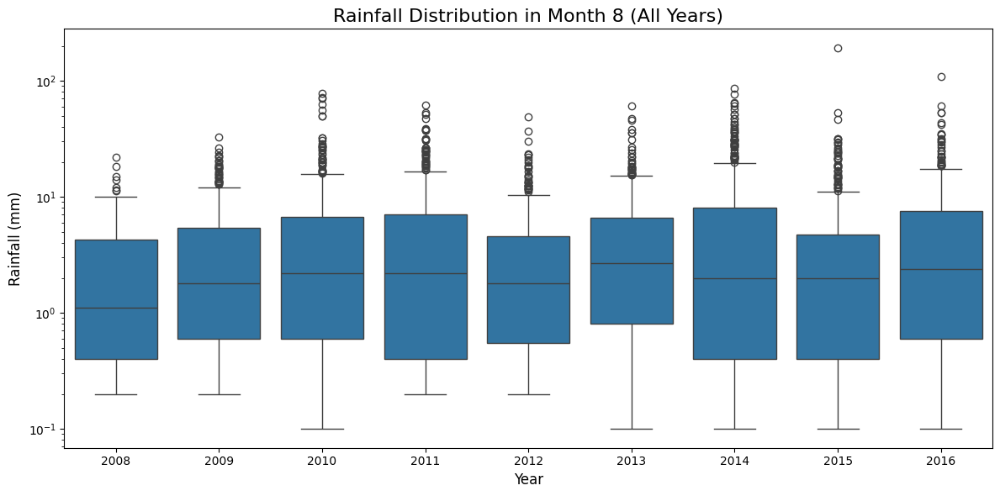

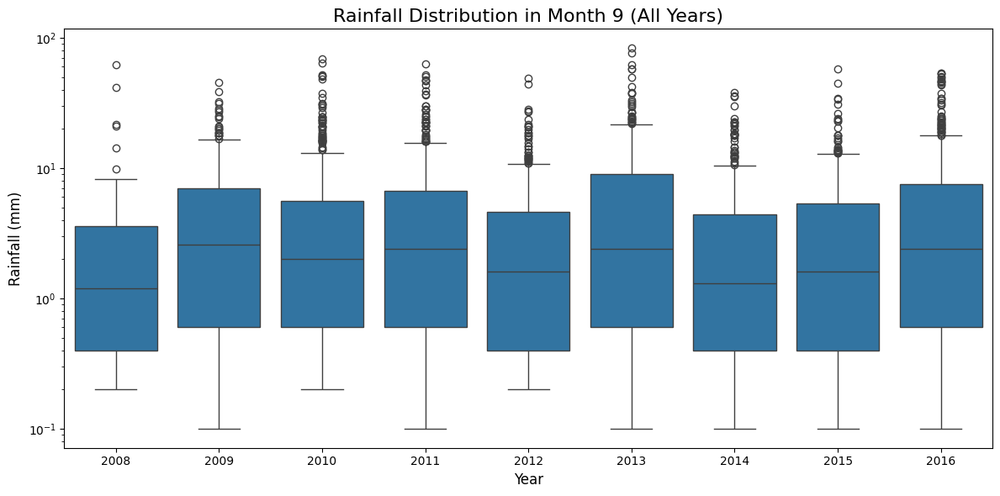

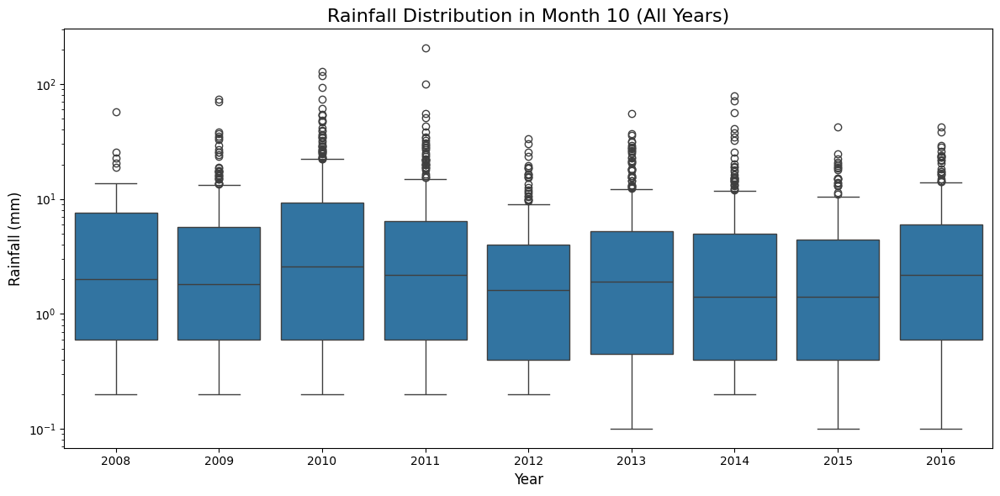

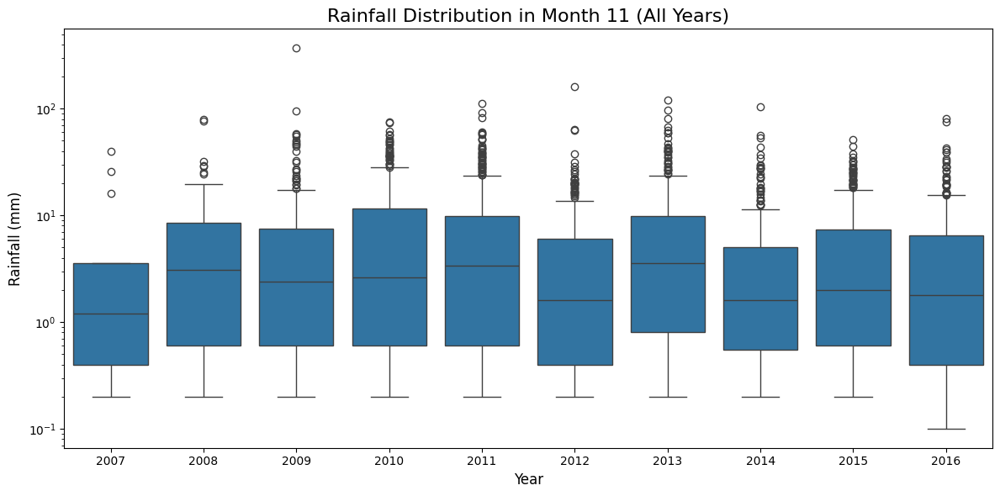

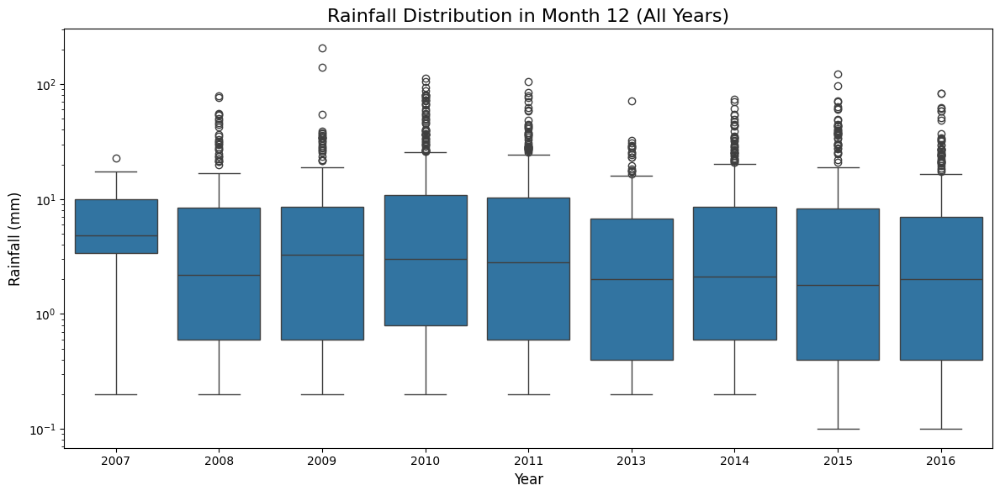

In [12]:
def historic_by_month_box(df, month):
    # Filter data to include only December of all years
    df_with_rains = df[df['Rainfall'] > 0]
    df_month = df_with_rains[(df_with_rains['Date'].dt.month == month) ]
    
    # Create a boxplot of 'Rainfall' for all Decembers
    plt.figure(figsize=(12, 6))
    ax = sns.boxplot(x='Year', y='Rainfall', data=df_month)
    ax.set_yscale('log')
    # Customize the plot
    plt.title(f'Rainfall Distribution in Month {month} (All Years)', fontsize=16)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Rainfall (mm)', fontsize=12)
    
    # Show the plot
    plt.tight_layout()
    plt.show()
for i in range(1, 13):
    historic_by_month_box(rains, i)

In [10]:
rains['ConsecutiveRainDays'] = 0

# Track consecutive rainy days
consecutive_days = 0
for i in rains.index:
    if rains.loc[i, "RainToday"] == "Yes":
        consecutive_days += 1
    else:
        consecutive_days = 0
    rains.loc[i, 'ConsecutiveRainDays'] = consecutive_days


In [13]:
rains['ConsecutiveRainDays'].describe()

count    113754.000000
mean          0.284227
std           0.606045
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           8.000000
Name: ConsecutiveRainDays, dtype: float64

Text(0, 0.5, 'Consecutive Rain Days')

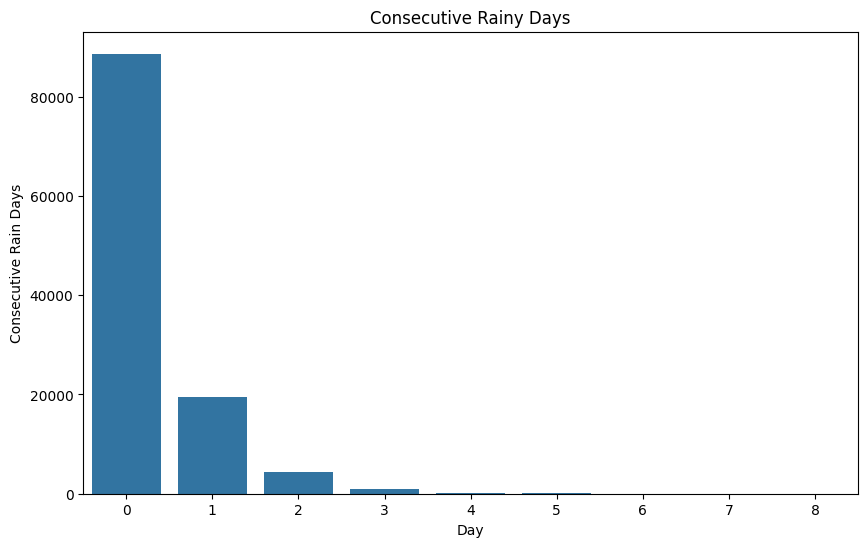

In [16]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    rains[['Date', 'ConsecutiveRainDays']].groupby('ConsecutiveRainDays').count().reset_index(),
    x='ConsecutiveRainDays',
    y='Date'
)
# ax.set_yscale('log')
ax.set_xticks(rains['ConsecutiveRainDays'].unique())

# Add labels and title
plt.title('Consecutive Rainy Days')

plt.xlabel('Day')
plt.ylabel('Consecutive Rain Days')


In [6]:
rains['RainRuns'] = 0

# Track consecutive rainy days
consecutive_days = 0
for i in rains.index:
    if rains.loc[i, "RainToday"] == "Yes":
        if consecutive_days < 0:
            consecutive_days = 1
        else:
            consecutive_days += 1
    else:
        if consecutive_days > 0:
            consecutive_days = -1
        else:
            consecutive_days -= 1
    rains.loc[i, 'RainRuns'] = consecutive_days


Text(0, 0.5, 'Rain Runs')

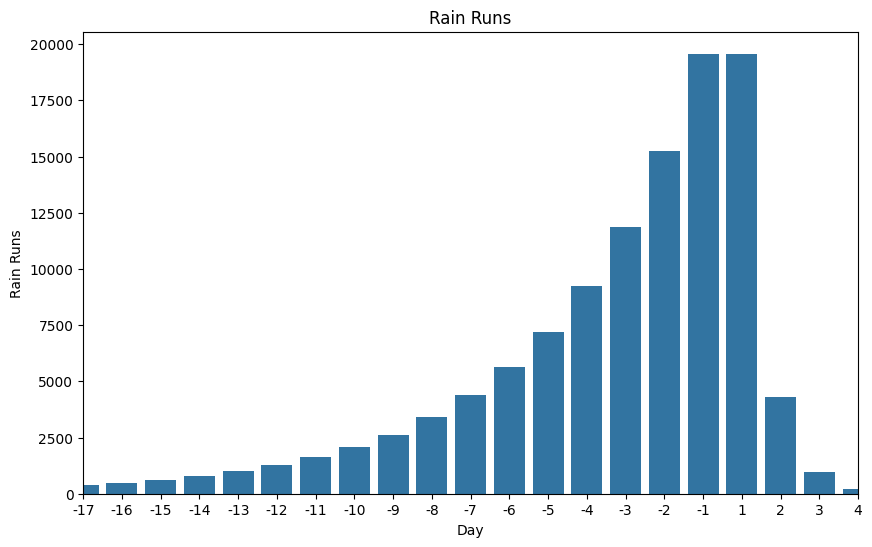

In [17]:
plt.figure(figsize=(10, 6))
runs = rains[['Date', 'RainRuns']].groupby('RainRuns').count().reset_index()
ax = sns.barplot(
    runs,
    x='RainRuns',
    y='Date'
)
# ax.set_yscale('log')
# ax.set_xticks(rains['RainRuns'].unique())
# ax.set_xticks(ticks=np.arange(0, len(rains['RainRuns']) + 1, 10))
# plt.xticks(ticks=np.arange(0, len(rains['RainRuns']) + 1, 10)) 
# Add labels and title
plt.title('Rain Runs')
ax.set_xlim(20, 40)
plt.xlabel('Day')
plt.ylabel('Rain Runs')


In [8]:
runs['RainRuns']

0    -37
1    -36
2    -35
3    -34
4    -33
5    -32
6    -31
7    -30
8    -29
9    -28
10   -27
11   -26
12   -25
13   -24
14   -23
15   -22
16   -21
17   -20
18   -19
19   -18
20   -17
21   -16
22   -15
23   -14
24   -13
25   -12
26   -11
27   -10
28    -9
29    -8
30    -7
31    -6
32    -5
33    -4
34    -3
35    -2
36    -1
37     1
38     2
39     3
40     4
41     5
42     6
43     7
44     8
Name: RainRuns, dtype: int64

# Visualizations 

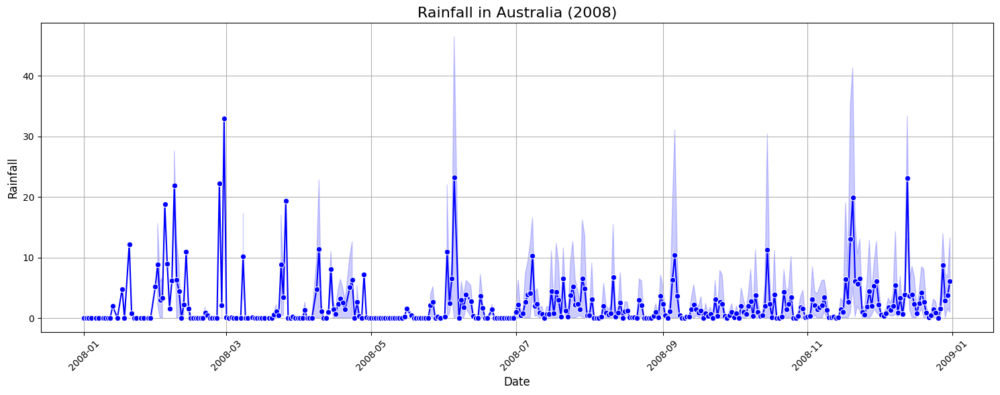

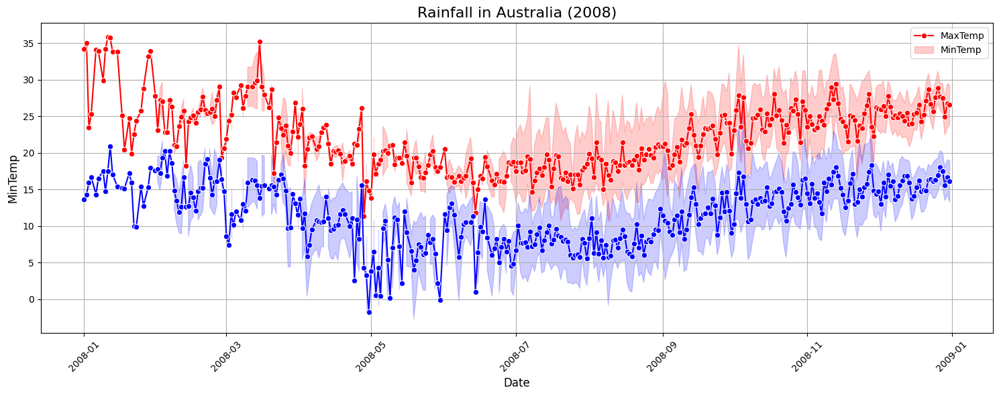

In [29]:
def plot_series(df, column, year, color='b'):
    first_year = rains[rains['Date'].dt.year == year]

    # Create a line plot of 'Rainfall' over time
    sns.lineplot(x='Date', y=column, data=first_year, marker='o', color=color)

    # Customize the plot
    plt.title(f'Rainfall in Australia ({year})', fontsize=16)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel(column, fontsize=12)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid(True)  # Add grid

    # Show the plot


plt.figure(figsize=(15, 6))
plot_series(rains, 'Rainfall', 2008)
plt.show()
plt.figure(figsize=(15, 6))
plot_series(rains, 'MaxTemp', 2008, color='r')
plot_series(rains, 'MinTemp', 2008, color='b')
plt.legend(['MaxTemp', 'MinTemp'])
plt.show()


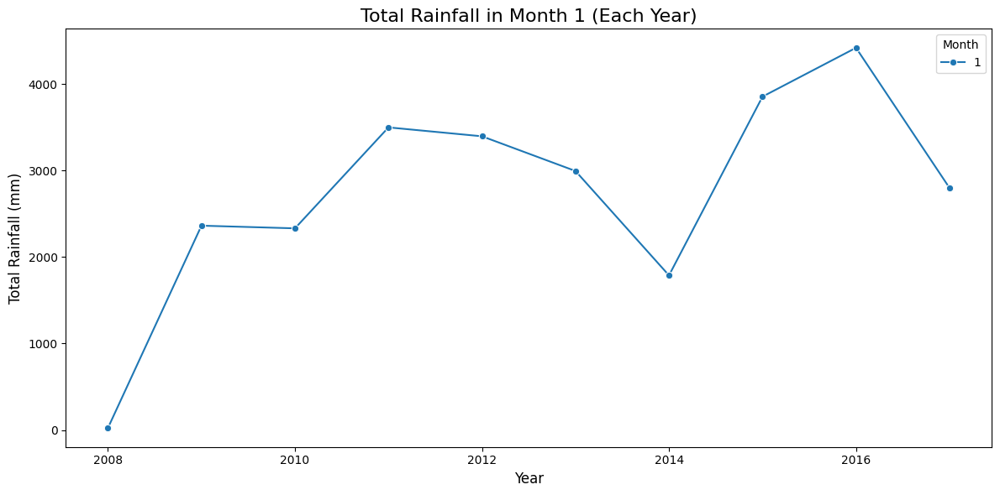

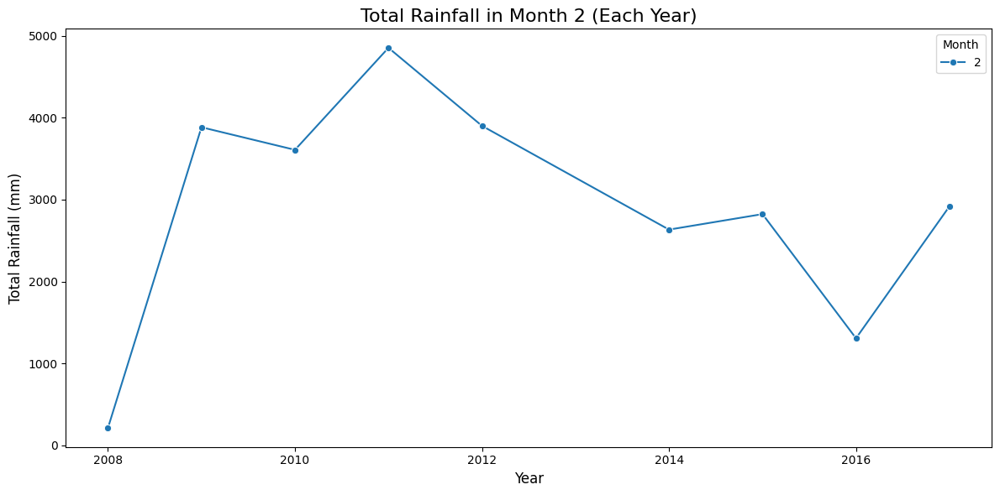

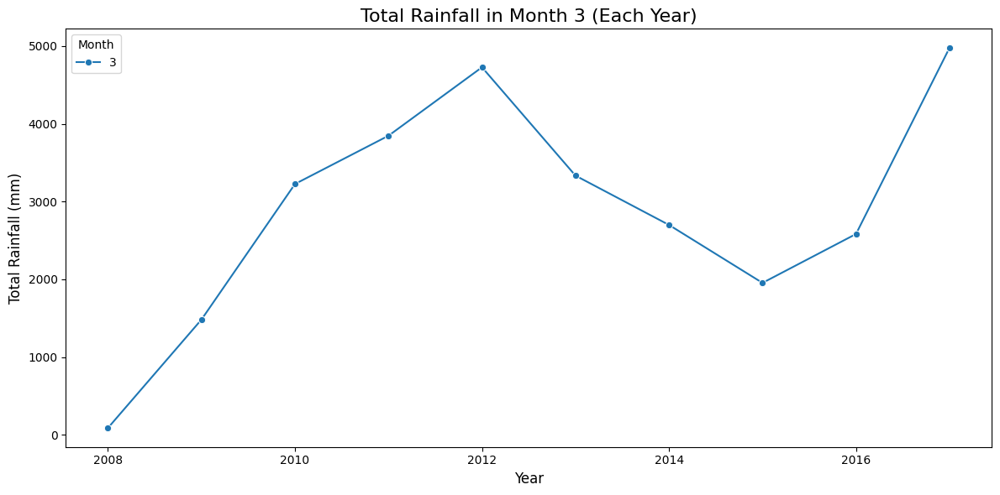

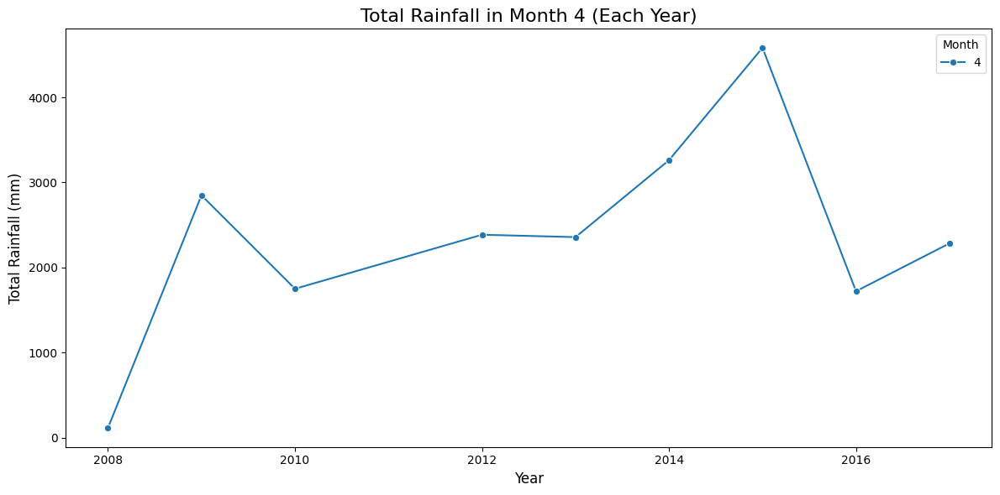

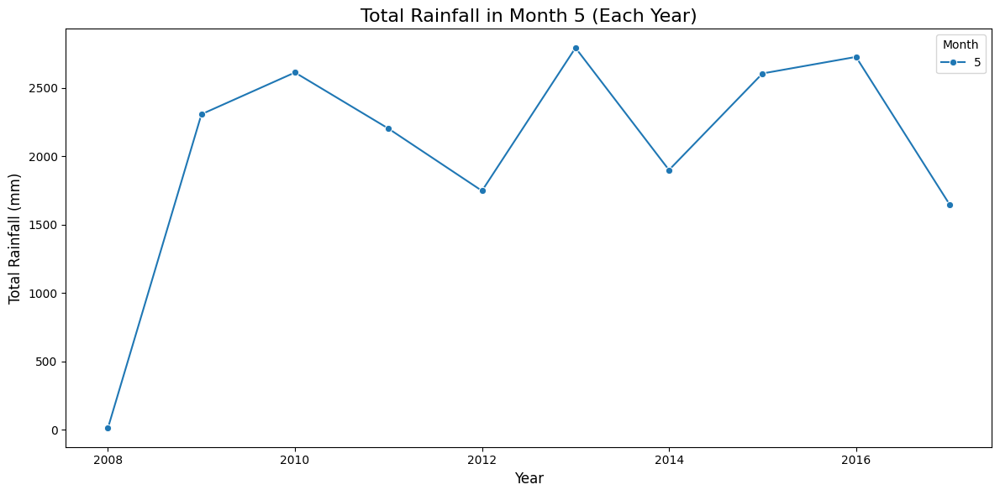

...

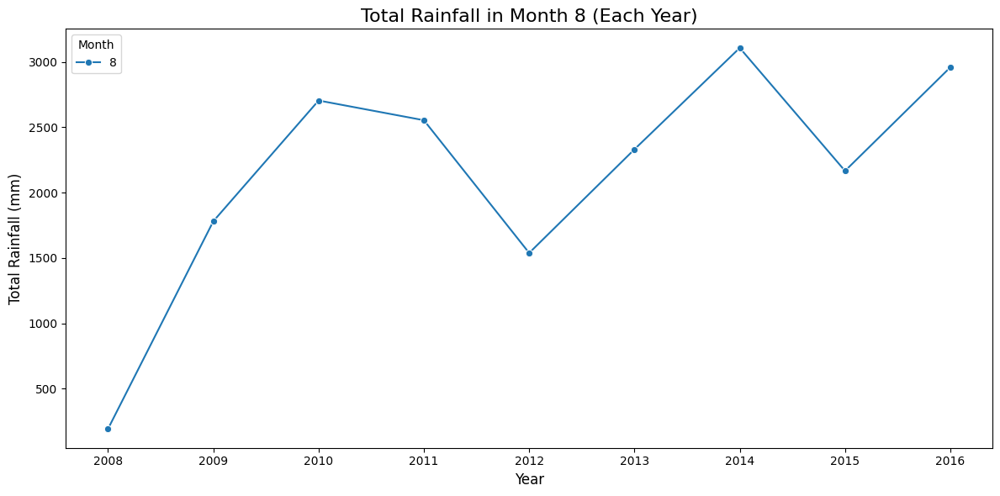

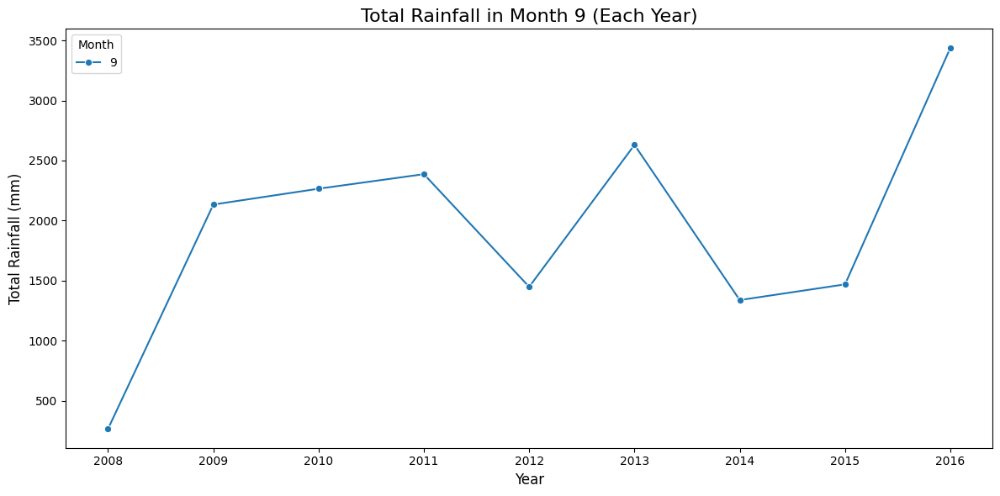

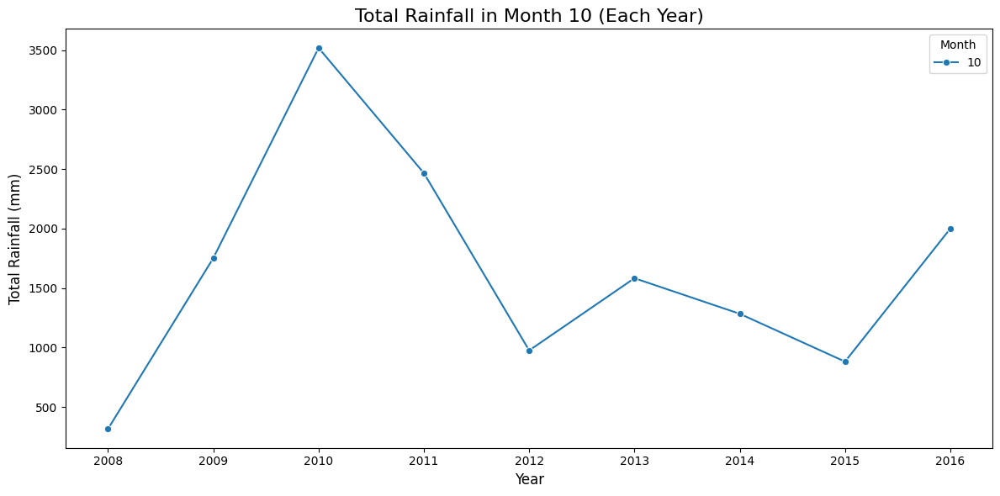

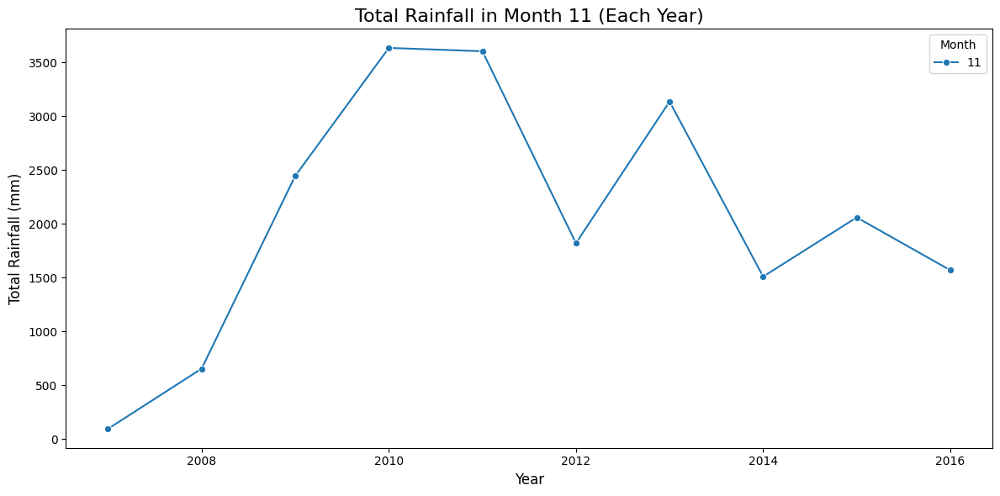

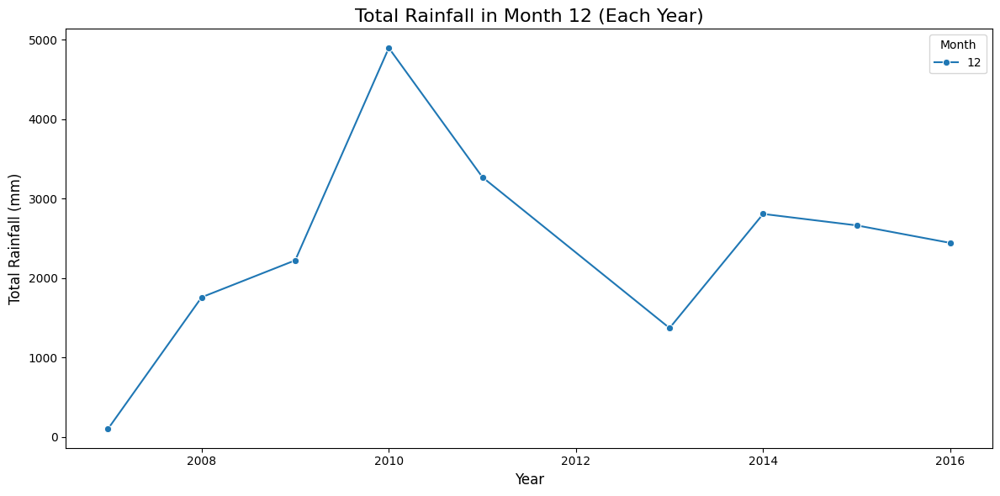

In [30]:
def total_rains_by_month_line(df, month):
    df_month = df[df['Date'].dt.month == month]

    # Group by year and calculate the total rainfall for each December
    total_rain_month = df_month.groupby(df_month['Date'].dt.year)['Rainfall'].sum().reset_index()

    # Create a line plot of the total rainfall for each December
    sns.lineplot(x='Date', y='Rainfall', data=total_rain_month, marker='o', label=f'{month}')

    # Customize the plot
    plt.title(f'Total Rainfall in Month {month} (Each Year)', fontsize=16)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Total Rainfall (mm)', fontsize=12)
    plt.legend(title='Month')
    # Show the plot
    plt.tight_layout()


for i in range(1, 13):
    plt.figure(figsize=(12, 6))
    total_rains_by_month_line(rains, i)
    plt.show()

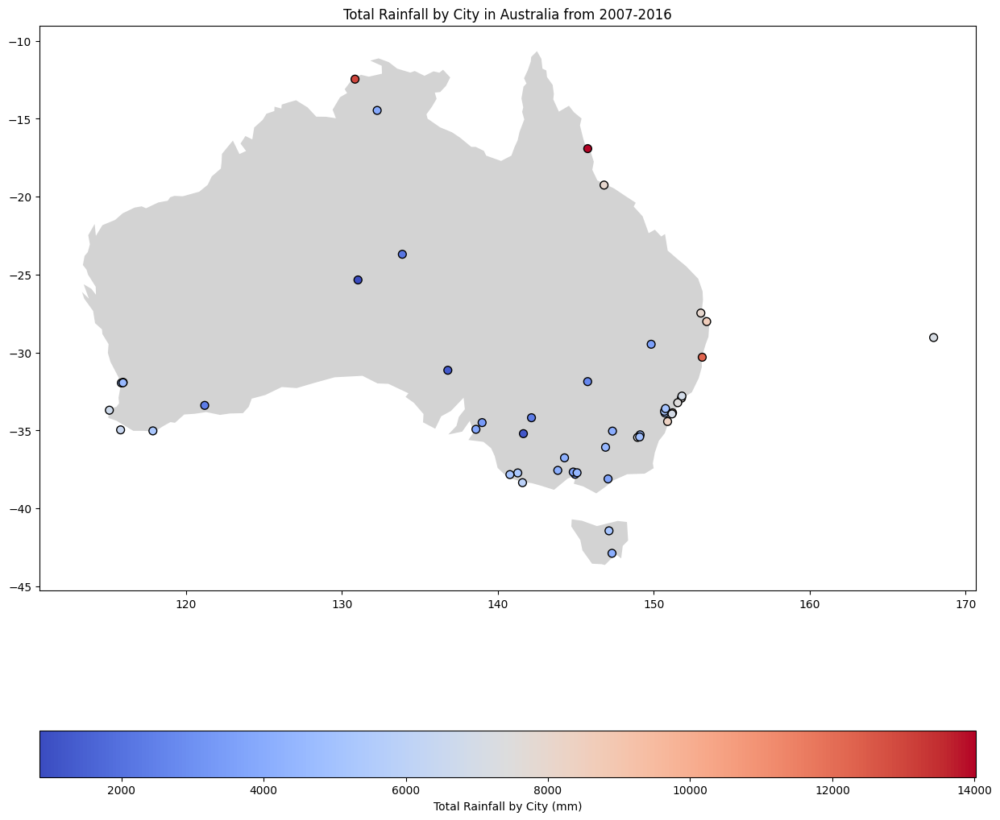

In [31]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point

# Load the dataset
data = rains

# Drop rows with missing 'Rainfall' and 'Location' values
data_clean = data.dropna(subset=['Rainfall', 'Location'])

# Group by city (Location) and get total rainfall for each city
rainfall_by_city = data_clean.groupby('Location')['Rainfall'].sum().reset_index()

# Get unique city locations (we assume that each city is a point)
# For simplicity, let's use a hypothetical dataset for city coordinates
# For real-world use, you'd replace this with actual coordinates or a geospatial file

# Hypothetical city coordinates (latitude, longitude)
# Coordinates for the cities (replace with actual coordinates or use a geocoding API)


# Create GeoDataFrame with city coordinates and rainfall data
rainfall_by_city['Coordinates'] = rainfall_by_city['Location'].map(city_coords)
rainfall_by_city['geometry'] = rainfall_by_city['Coordinates'].apply(lambda x: Point(x[1], x[0]))
gdf = gpd.GeoDataFrame(rainfall_by_city, geometry='geometry')

# Load a map of Australia
world = gpd.read_file('../data/110m_cultural/ne_110m_admin_0_countries.shp')
australia = world[world['NAME'] == "Australia"]

# Plot the rainfall by city on a map
fig, ax = plt.subplots(figsize=(15, 15))
australia.plot(ax=ax, color='lightgrey')

# Plot cities as points on the map, color-coded by total rainfall
gdf.plot(ax=ax, markersize=50, column='Rainfall', cmap='coolwarm', legend=True,
         legend_kwds={'label': "Total Rainfall by City (mm)", 'orientation': "horizontal"},
         edgecolor='black',  # Set marker edges to black for contrast
         linewidth=1  # Increase edge width for "bold" appearance)
         )
# Set title and show plot
plt.title('Total Rainfall by City in Australia from 2007-2016')
plt.show()


<Axes: >

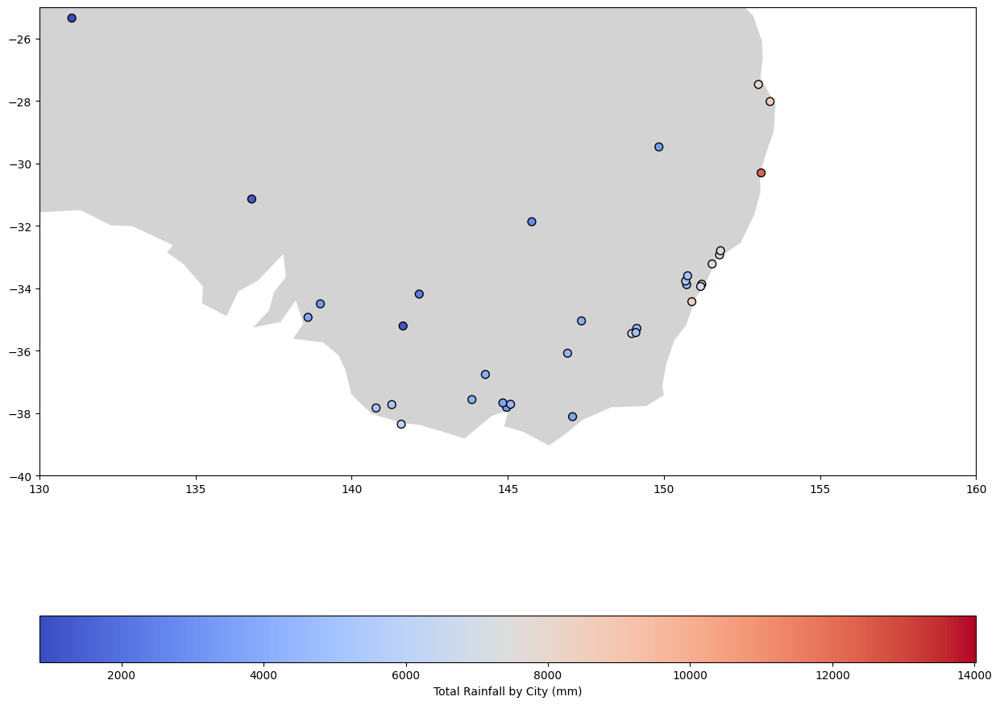

In [32]:
fig, ax = plt.subplots(figsize=(15, 15))
ax.set_xlim(130, 160)
ax.set_ylim(-40, -25)
australia.plot(ax=ax, color='lightgrey')
gdf.plot(ax=ax, markersize=50, column='Rainfall', cmap='coolwarm', legend=True,
         legend_kwds={'label': "Total Rainfall by City (mm)", 'orientation': "horizontal"},
         edgecolor='black',
         linewidth=1)

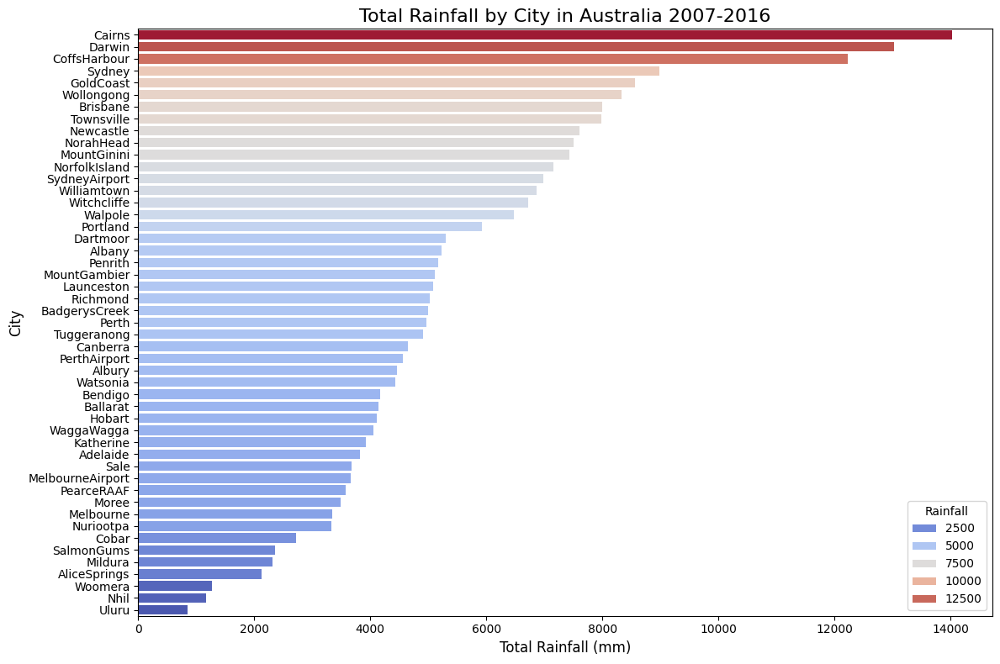

In [33]:
data_clean = rains.dropna(subset=['Rainfall', 'Location'])

# Group by city (Location) and sum rainfall
rainfall_by_city = data_clean.groupby('Location')['Rainfall'].sum().reset_index()

# Sort by total rainfall for better visualization
rainfall_by_city = rainfall_by_city.sort_values('Rainfall', ascending=False)

# Create the bar plot
plt.figure(figsize=(12, 8))
sns.barplot(
    x='Rainfall',
    y='Location',
    data=rainfall_by_city,
    palette='coolwarm',
    hue='Rainfall',
)

# Add labels and title
plt.xlabel('Total Rainfall (mm)', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.title('Total Rainfall by City in Australia 2007-2016', fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()

/tmp/ipykernel_2119532/2627161794.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_clean['year'] = data_clean['Date'].dt.year


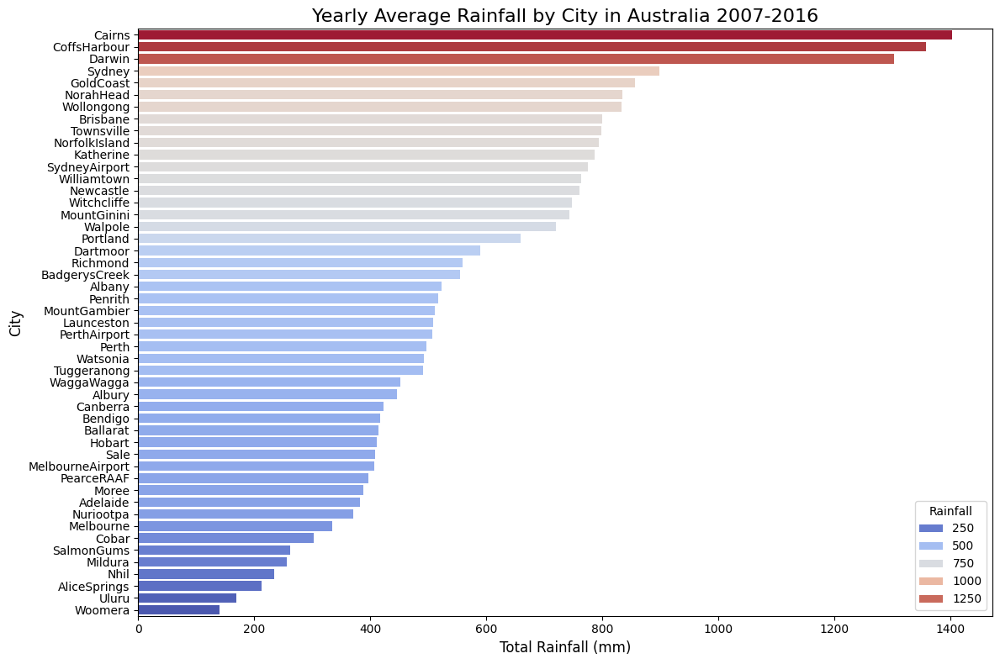

In [35]:
data_clean['year'] = data_clean['Date'].dt.year
group_by_loc_year = data_clean.groupby(['Location', 'year'])['Rainfall'].sum().groupby('Location').mean().reset_index()

rainfall_by_city = group_by_loc_year.sort_values('Rainfall', ascending=False)

# Create the bar plot
plt.figure(figsize=(12, 8))
sns.barplot(
    x='Rainfall',
    y='Location',
    data=rainfall_by_city,
    palette='coolwarm',
    hue='Rainfall',
)

# Add labels and title
plt.xlabel('Total Rainfall (mm)', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.title('Yearly Average Rainfall by City in Australia 2007-2016', fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Data cleaning

In [ ]:
# Tratamiento para nulls: RainTomorrow 

# Al ser la variable target, no hay mucho para hacer. Se procede a eliminarlas.

In [36]:
rains[rains['RainTomorrow'].isnull()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,RainTomorrow,ConsecutiveRainDays


In [37]:
rains.dropna(subset=['RainTomorrow'], inplace=True)
assert(len(rains[rains['RainTomorrow'].isnull()]) == 0)

In [38]:
nulls_by_row = rains.isnull().sum(axis=1)
nulls_by_row.describe()

count    113754.000000
mean          2.230058
std           2.467382
min           0.000000
25%           0.000000
50%           2.000000
75%           4.000000
max          20.000000
dtype: float64

<Axes: ylabel='Year'>

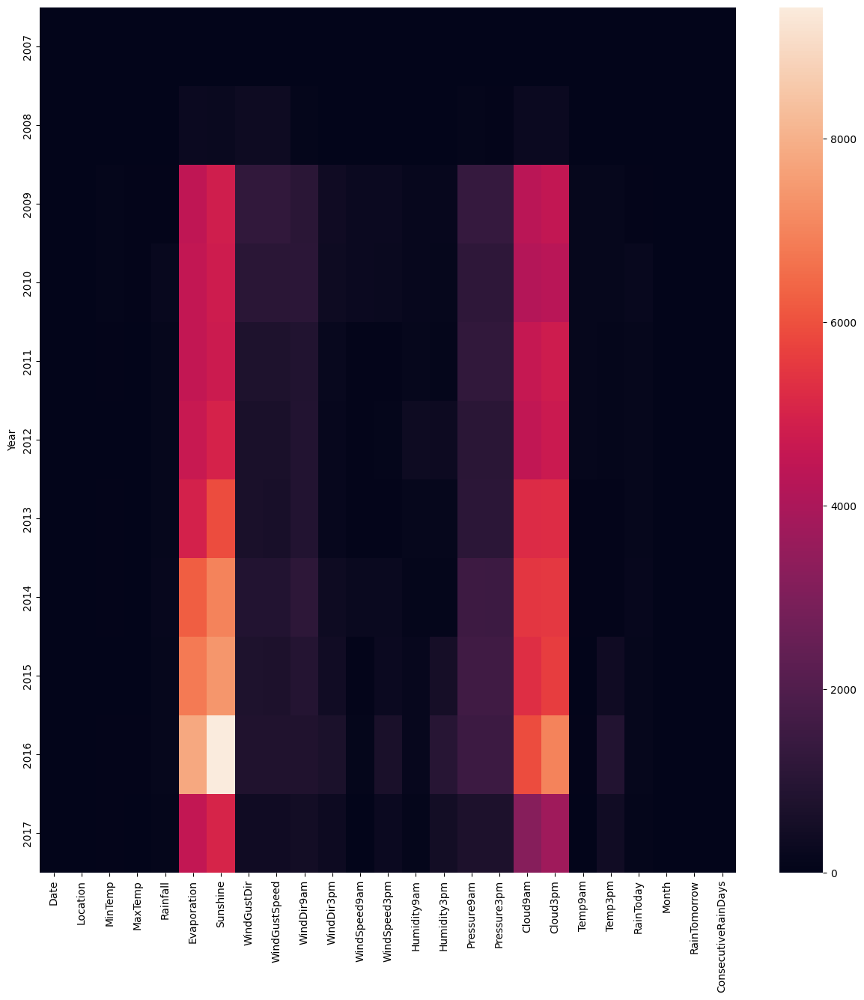

In [39]:
rains['Year'] = rains['Date'].dt.year
rains['Month'] = rains['Date'].dt.month
plt.figure(figsize=(15,15))
sns.heatmap(rains.groupby('Year').apply(lambda x: x.isnull().sum(), include_groups=False))

<Axes: ylabel='Month'>

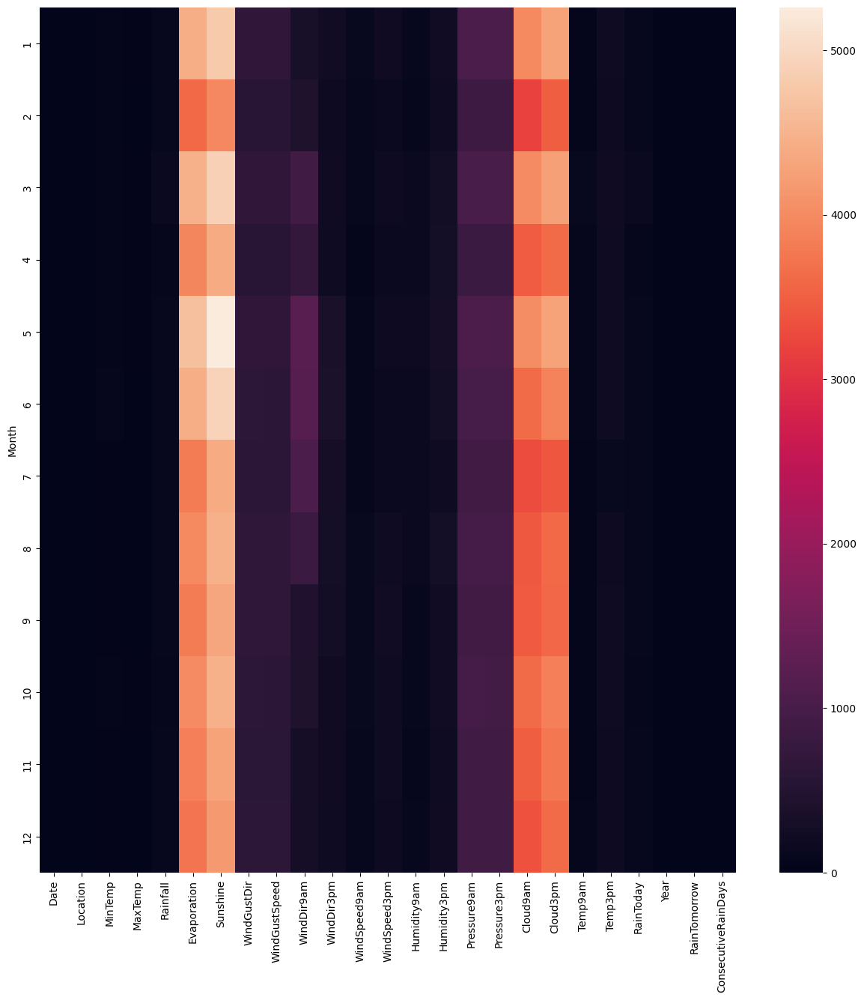

In [40]:
plt.figure(figsize=(15,15))
sns.heatmap(rains.groupby('Month').apply(lambda x: x.isnull().sum(), include_groups=False))

<Axes: ylabel='Location'>

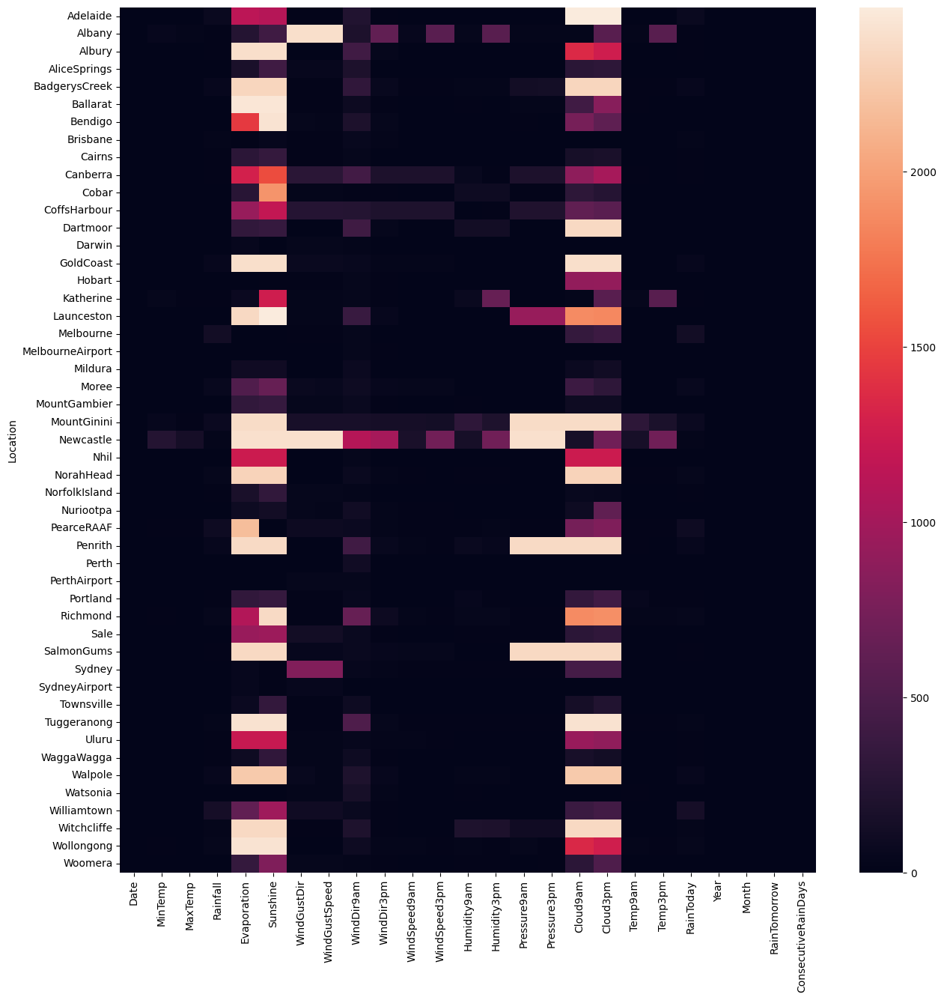

In [41]:
plt.figure(figsize=(15,15))
sns.heatmap(rains.groupby('Location').apply(lambda x: x.isnull().sum(), include_groups=False), annot=False)

In [42]:
from sklearn.base import BaseEstimator, TransformerMixin

def is_null(value):
    if isinstance(value, str):
        return value == None
    if isinstance(value, pd.core.series.Series) or isinstance(value, np.ndarray):
        return len(value) == 0
    else:
        return np.isnan(value)

def impute_row_hierarchicaly(
        row,
        features,
        grouped_2_levels,
        grouped_1_level,
        global_values,
        l1_group_key = "Location",
        l2_group_key = "Month"
):
    for c in features:
        imputation_value = grouped_2_levels.loc[(row[l1_group_key], row[l2_group_key])][c]
        if is_null(imputation_value):
            imputation_value = grouped_1_level.loc[row[l1_group_key]][c]
        if is_null(imputation_value):
            imputation_value = global_values[c]
        row[c] = imputation_value
    return row


class HierarchicalImputer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.global_mean = None
        self.mean_by_location = None
        self.mean_by_location_month = None

        self.global_top = None
        self.top_by_location = None
        self.top_by_location_month = None

        self.mean_adjusted = ["Rainfall", "Evaporation", "Sunshine", "Cloud9am", "Cloud3pm", "WindGustSpeed", "WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure9am", "Pressure3pm", "Temp9am", "Temp3pm", "MinTemp", "MaxTemp"]
        self.top_adjusted = ["WindGustDir", "WindDir9am", "WindDir3pm"]



    def fit(self, X, y = None):
        group_l1_l2 = lambda features: X[["Location", "Month"] + features].groupby(["Location", "Month"])
        group_l1 = lambda features: X[["Location"] + features].groupby(["Location"])

        self.mean_by_location_month = group_l1_l2(self.mean_adjusted).mean()
        self.mean_by_location = group_l1(self.mean_adjusted).mean()
        self.global_mean = X[self.mean_adjusted].mean()

        def mode(x):
            m = x.mode()
            if isinstance(x, pd.core.series.Series) or isinstance(x, np.ndarray):
                if len(m) == 0:
                    return np.nan
                else:
                    return m[0]
            else:
                return m
        self.top_by_location_month = group_l1_l2(self.top_adjusted).agg(mode)
        self.top_by_location = group_l1(self.top_adjusted).agg(mode)
        self.global_top = X[self.top_adjusted].agg(mode)
        return self

    def transform(self, X):
        X_copy = X.copy()
        mean_imputer = lambda row: impute_row_hierarchicaly(row, self.mean_adjusted,  self.mean_by_location_month, self.mean_by_location, self.global_mean, l1_group_key = "Location", l2_group_key = "Month")
        top_imputer = lambda row: impute_row_hierarchicaly(row, self.top_adjusted, self.top_by_location_month, self.top_by_location, self.global_top, l1_group_key = "Location", l2_group_key = "Month")
        imputer = lambda row: top_imputer(mean_imputer(row))
        return X_copy.apply(imputer, axis=1)


# Imputacion y escalamiento

In [43]:
imputer = HierarchicalImputer()
imputer.fit(rains)


HierarchicalImputer()

In [44]:
rains_imp = imputer.transform(rains)

In [45]:
rains_imp["RainTodayNull"] = rains_imp["RainToday"].isnull().astype(np.int64)
rains_imp["RainToday"] = rains_imp["RainToday"].fillna(0)

In [46]:
rains_imp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113754 entries, 103642 to 122308
Data columns (total 27 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Date                 113754 non-null  datetime64[ns]
 1   Location             113754 non-null  object        
 2   MinTemp              113754 non-null  float64       
 3   MaxTemp              113754 non-null  float64       
 4   Rainfall             113754 non-null  float64       
 5   Evaporation          113754 non-null  float64       
 6   Sunshine             113754 non-null  float64       
 7   WindGustDir          113754 non-null  object        
 8   WindGustSpeed        113754 non-null  float64       
 9   WindDir9am           113754 non-null  object        
 10  WindDir3pm           113754 non-null  object        
 11  WindSpeed9am         113754 non-null  float64       
 12  WindSpeed3pm         113754 non-null  float64       
 13  Humidity9am   

In [47]:
coordinates = pd.read_csv("../data/worldcities.csv")
coordinates["Location"] = coordinates["city"]
coordinates.drop(columns=["city"], inplace = True)
coordinates = coordinates[coordinates["country"] == "Australia"]

In [48]:
rains_imp = rains_imp.merge(coordinates[["Location", "lat", "lng"]], right_on="Location", left_on="Location", how="left")

In [49]:

#Fill missing latitudes using city_coords
rains_imp.loc[rains_imp["lat"].isnull(), "lat"] = rains_imp.loc[
    rains_imp["lat"].isnull(), "Location"
].apply(lambda loc: city_coords[loc][0] if loc in city_coords else None).astype(np.float64)

# Fill missing longitudes using city_coords
rains_imp.loc[rains_imp["lng"].isnull(), "lng"] = rains_imp.loc[
    rains_imp["lng"].isnull(), "Location"
].apply(lambda loc: city_coords[loc][1] if loc in city_coords else None).astype(np.float64)

In [50]:
# List of compass directions
directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']

# Map directions to degrees
direction_to_degrees = {direction: i * 22.5 for i, direction in enumerate(directions)}


In [51]:
rains_imp["WindGustDirDeg"] = rains_imp.loc[:, "WindGustDir"].apply(lambda direc: direction_to_degrees[direc])
rains_imp["WindDir9amDeg"] = rains_imp.loc[:, "WindDir9am"].apply(lambda direc: direction_to_degrees[direc])
rains_imp["WindDir3pmDeg"] = rains_imp.loc[:, "WindDir3pm"].apply(lambda direc: direction_to_degrees[direc])


In [52]:
rains_imp.drop(columns=["WindGustDir", "WindDir9am", "WindDir3pm"], inplace=True)
rains_imp["RainTomorrow"] = rains_imp["RainTomorrow"].apply(lambda rain: 1 if rain == "Yes" else 0)
rains_imp["RainToday"] = rains_imp["RainToday"].apply(lambda rain: 1 if rain == "Yes" else 0)

In [53]:
rains_x.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,2008,12
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,2008,12
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,2008,12
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,2008,12
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,2008,12


In [54]:
from sklearn.preprocessing import MinMaxScaler
rains_x = rains_imp.drop(columns=["RainTomorrow", "Date","Location"])
rains_y = rains_imp["RainTomorrow"]

rains_x_scaled = MinMaxScaler().fit_transform(rains_x)
rains_x = pd.DataFrame(rains_x_scaled, columns = rains_x.columns)

rains_scaled = rains_x.copy()
rains_scaled["RainTomorrow"] = rains_y

In [55]:
sampled = rains_scaled.sample(frac=0.1)
s_x = sampled.drop(columns=["RainTomorrow"])
s_y = sampled["RainTomorrow"]

In [56]:
rains_scaled

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Year,Month,ConsecutiveRainDays,RainTodayNull,lat,lng,WindGustDirDeg,WindDir9amDeg,WindDir3pmDeg,RainTomorrow
0,0.608188,0.771985,0.023949,0.508576,0.889631,0.689407,0.587762,0.481884,0.374938,0.247108,...,0.5,0.000000,0.000,0.0,0.275381,0.452216,0.400000,0.333333,0.733333,0
1,0.463531,0.449891,0.123988,0.260262,0.489969,0.531600,0.443681,0.553099,0.590424,0.653540,...,0.3,0.636364,0.000,0.0,0.317333,0.689560,0.866667,0.866667,0.533333,0
2,0.608250,0.661563,0.041289,0.420773,0.660703,0.474625,0.341754,0.416705,0.373668,0.332689,...,0.9,0.909091,0.000,0.0,0.261250,0.444714,0.666667,0.666667,0.666667,0
3,0.973075,0.881881,0.587775,0.293578,0.489969,0.580432,0.406049,0.329561,0.756731,0.730466,...,0.8,0.000000,0.000,0.0,0.933363,0.324908,0.933333,0.933333,0.933333,1
4,0.778571,0.720378,0.199764,0.367198,0.703856,0.227392,0.160975,0.264295,0.488381,0.609940,...,0.5,0.909091,0.000,0.0,0.506292,0.717648,0.133333,0.200000,0.133333,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116108,0.581331,0.747304,0.062673,0.457031,0.812485,0.611650,0.606339,0.484410,0.379281,0.204712,...,0.5,0.909091,0.000,0.0,0.285512,0.512025,0.466667,0.400000,0.733333,0
116109,0.825449,0.858130,0.081157,0.507080,0.645369,0.556761,0.590212,0.348358,0.370121,0.249694,...,0.7,0.090909,0.000,0.0,0.361794,0.580285,0.266667,0.266667,0.600000,0
116110,0.476089,0.432793,0.182862,0.260262,0.489969,0.835115,0.628191,0.688271,0.492590,0.604383,...,0.3,0.636364,0.125,0.0,0.277490,0.677071,0.800000,0.666667,0.133333,1
116111,0.574585,0.698921,0.054445,0.394672,0.891725,0.809020,0.787362,0.784833,0.329966,0.374101,...,0.8,0.909091,0.000,0.0,0.359379,0.016581,0.266667,0.266667,0.666667,0


In [57]:
rains_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116113 entries, 0 to 116112
Data columns (total 27 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   MinTemp              116113 non-null  float64
 1   MaxTemp              116113 non-null  float64
 2   Rainfall             116113 non-null  float64
 3   Evaporation          116113 non-null  float64
 4   Sunshine             116113 non-null  float64
 5   WindGustSpeed        116113 non-null  float64
 6   WindSpeed9am         116113 non-null  float64
 7   WindSpeed3pm         116113 non-null  float64
 8   Humidity9am          116113 non-null  float64
 9   Humidity3pm          116113 non-null  float64
 10  Pressure9am          116113 non-null  float64
 11  Pressure3pm          116113 non-null  float64
 12  Cloud9am             116113 non-null  float64
 13  Cloud3pm             116113 non-null  float64
 14  Temp9am              116113 non-null  float64
 15  Temp3pm          

In [58]:
from sklearn.manifold import TSNE


rains_embedded = TSNE(n_components=2, learning_rate='auto',init='random', perplexity=10, n_jobs=8).fit_transform(s_x)

<Axes: >

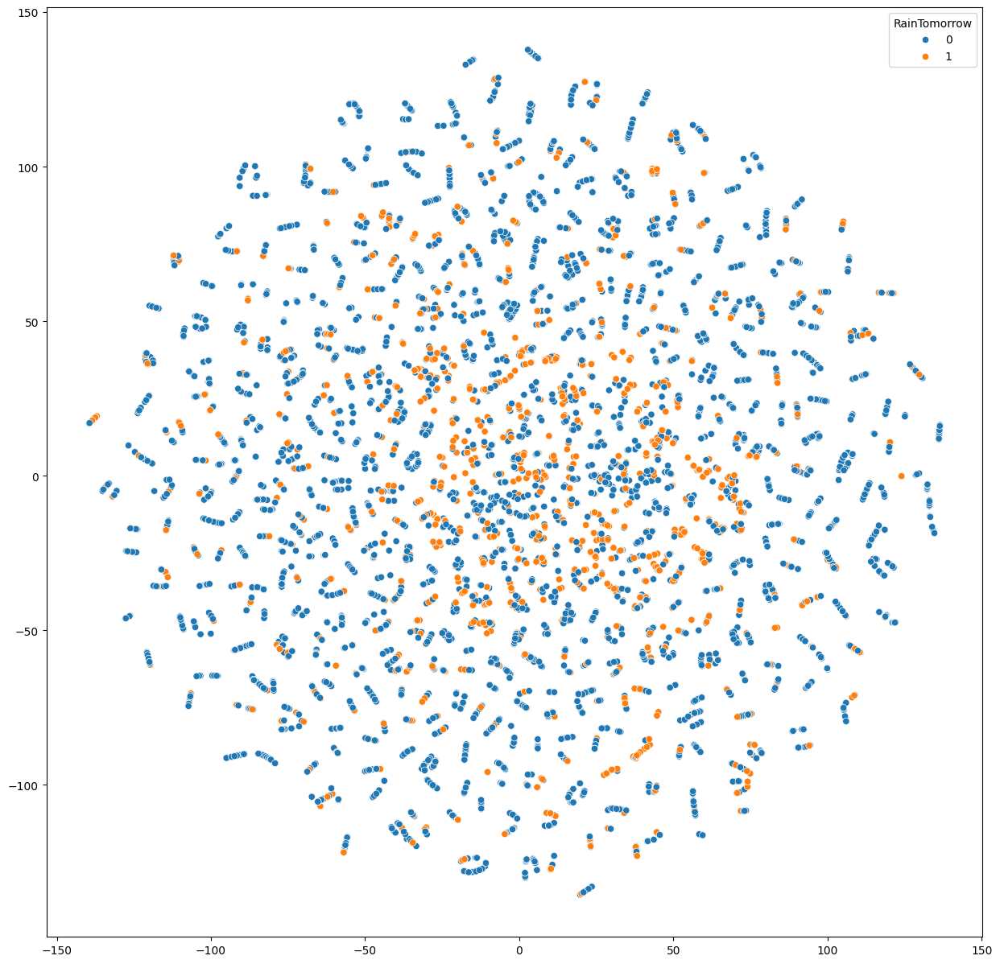

In [59]:
plt.figure(figsize=(15,15))
sns.scatterplot(x=rains_embedded.T[0],y=rains_embedded.T[1], hue=s_y)

In [60]:
embedds = []
for i in [5, 10, 20, 30, 40, 50, 60]:
    embedds.append(TSNE(n_components=2, learning_rate='auto',init='random', perplexity=i).fit_transform(s_x))


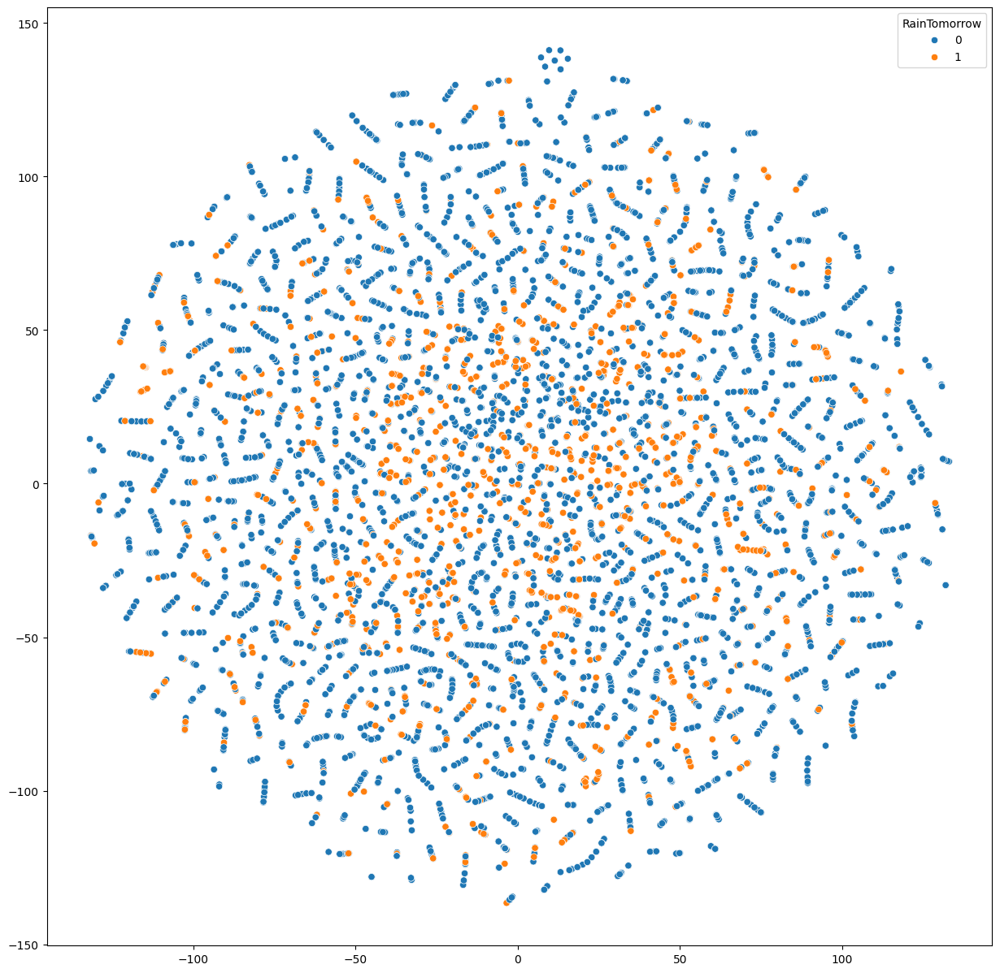

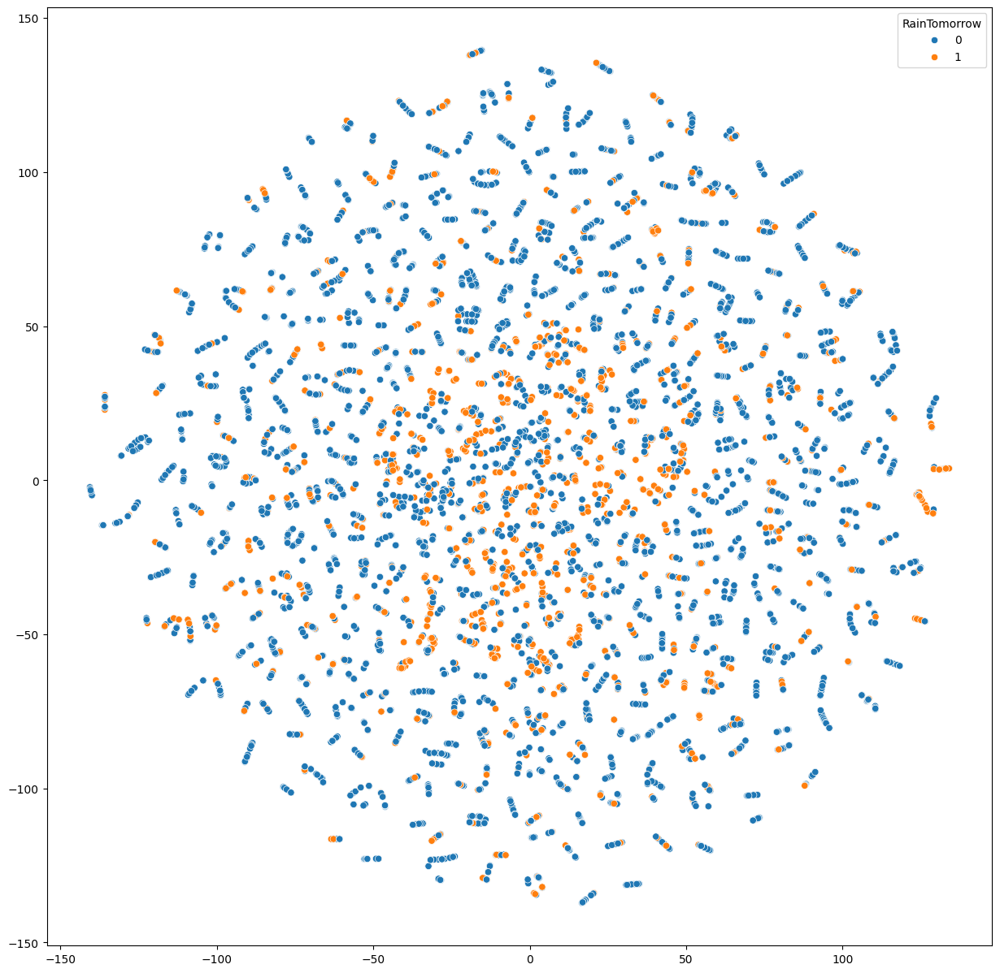

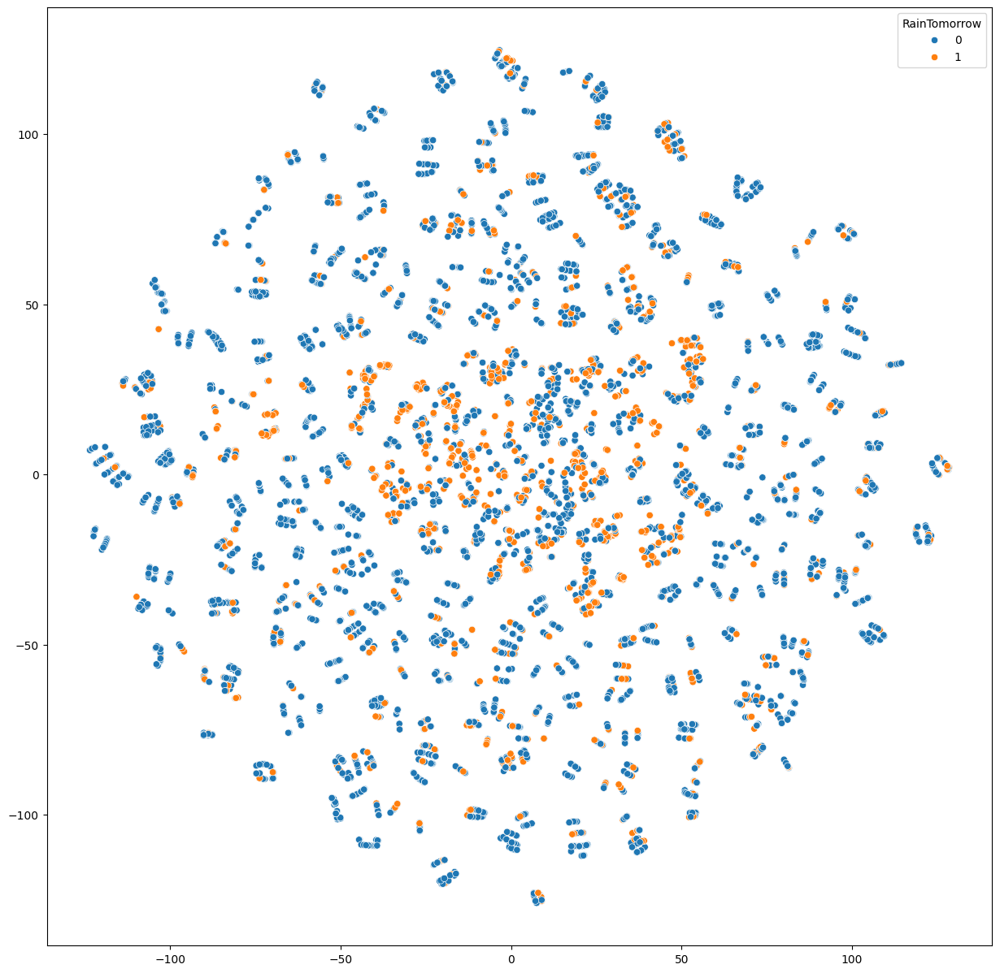

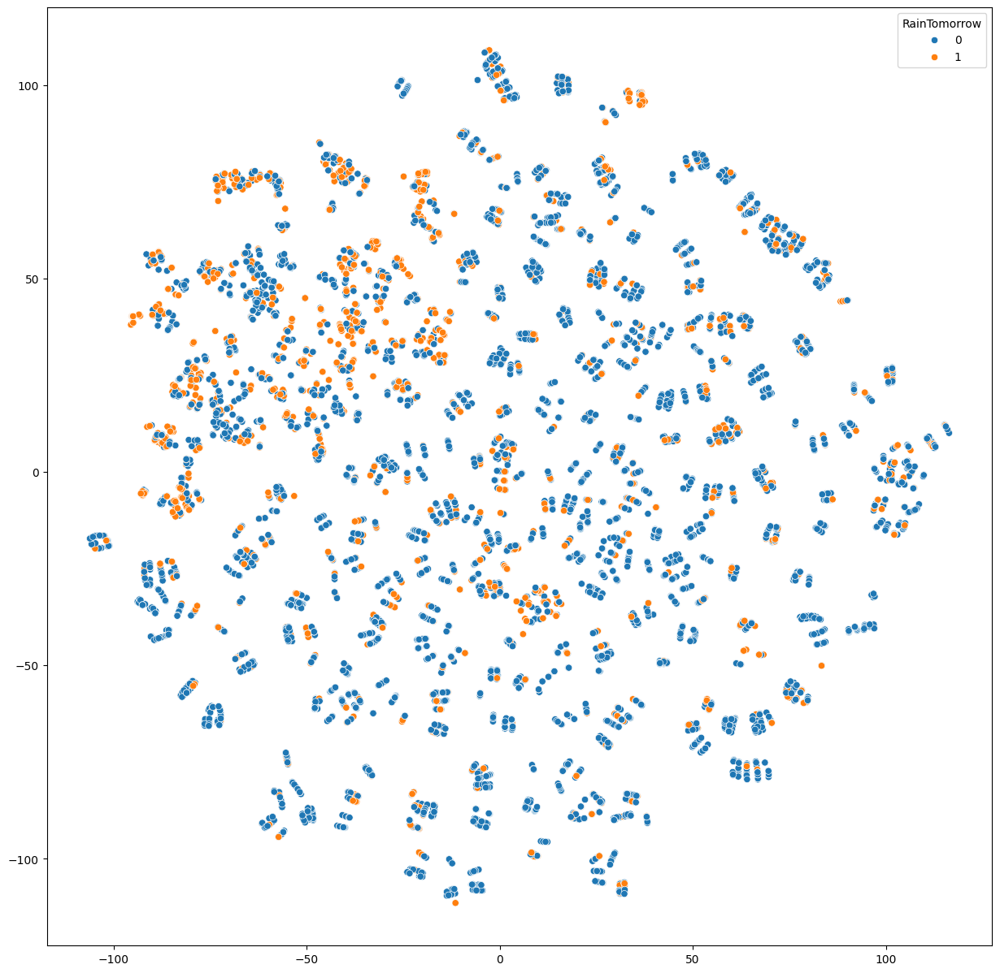

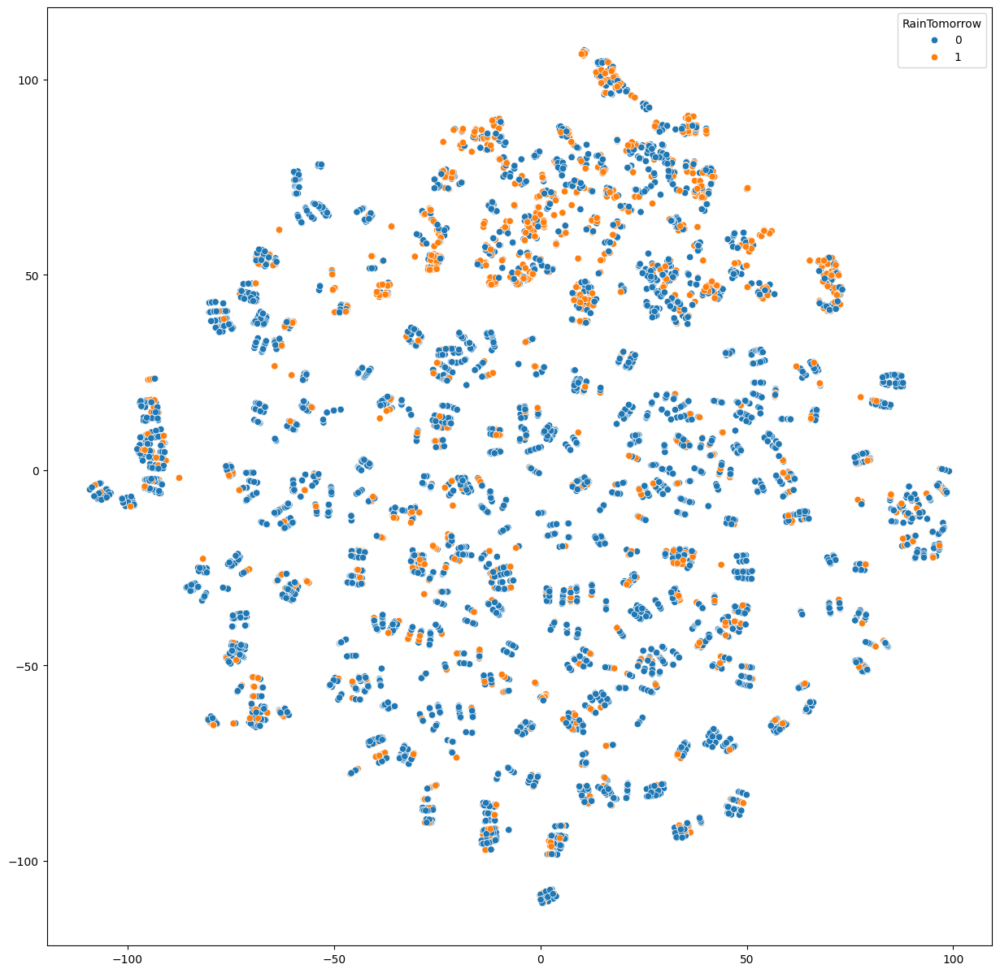

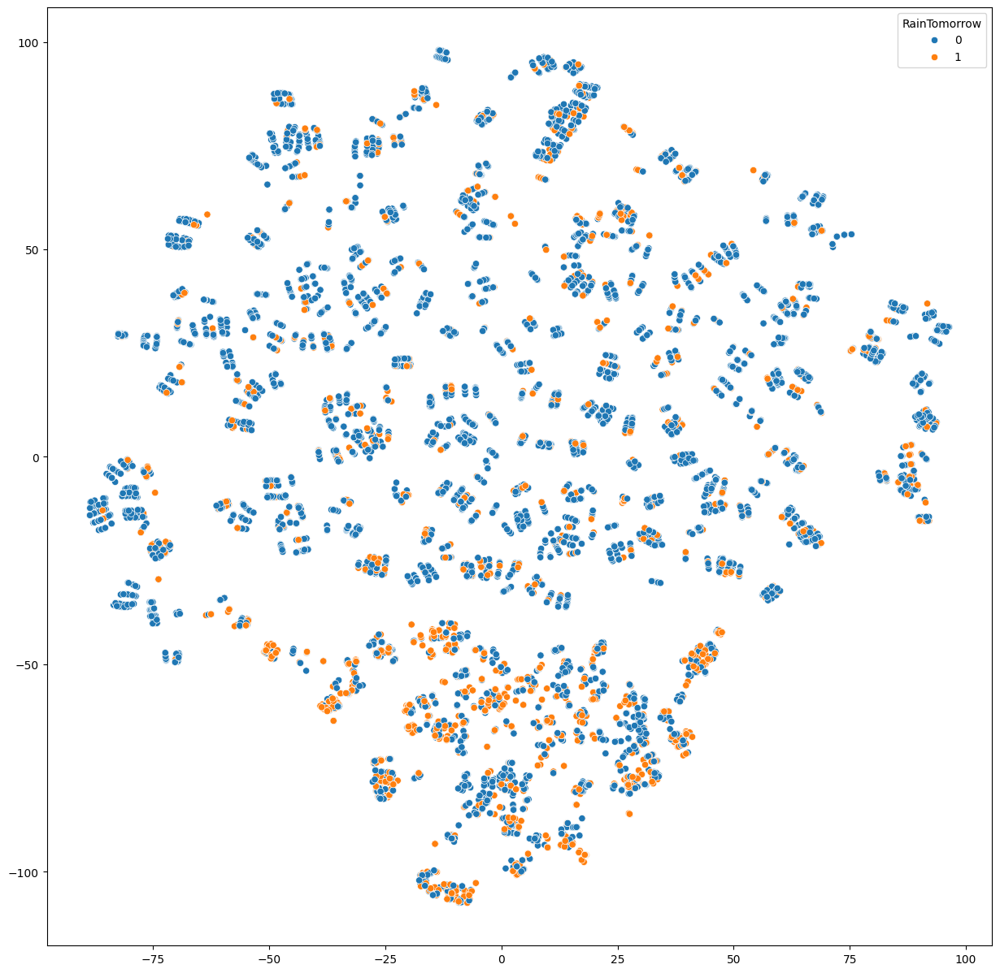

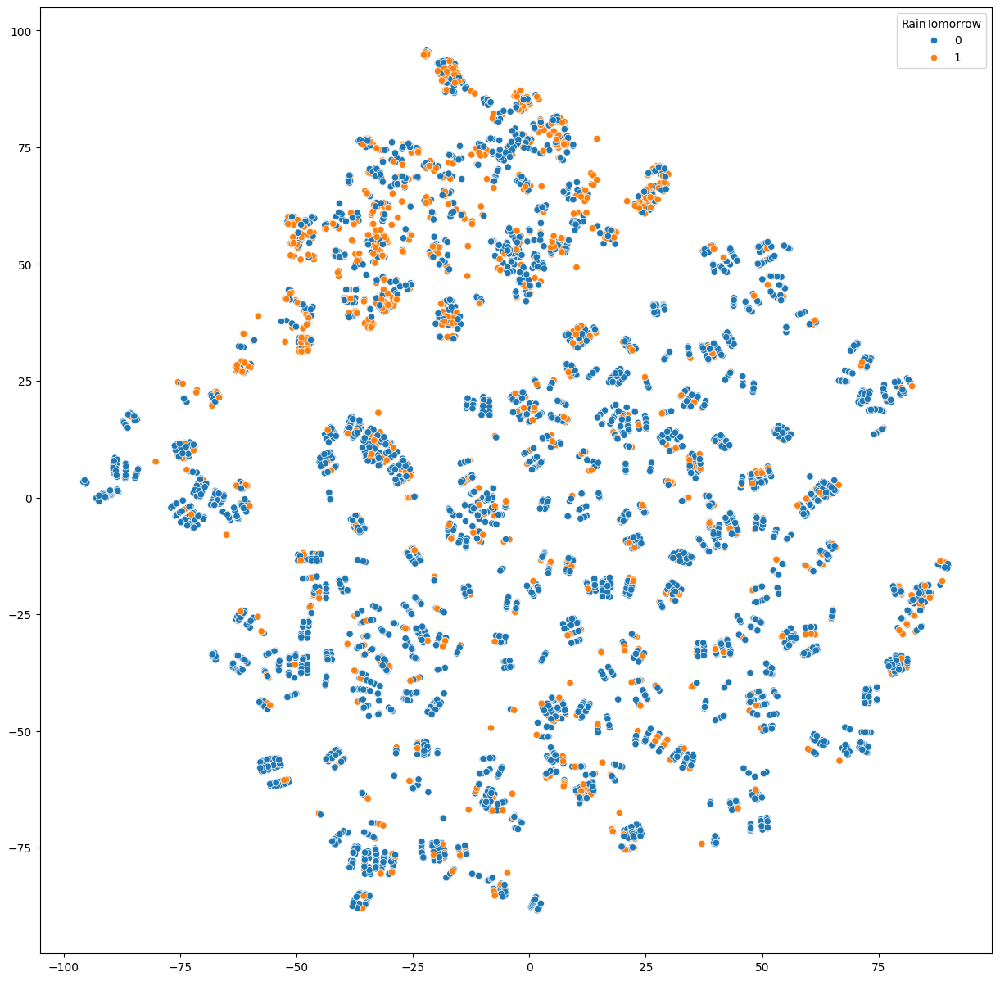

In [61]:
for em in embedds:
    plt.figure(figsize=(15,15))
    sns.scatterplot(x=em.T[0],y=em.T[1], hue=s_y)

<Axes: >

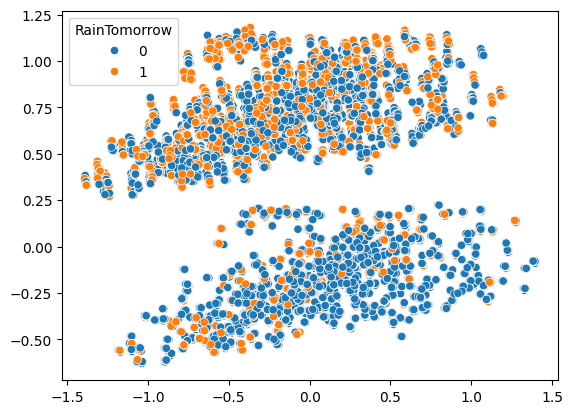

In [62]:
from sklearn.decomposition import PCA
pca_emb = PCA(n_components=2).fit_transform(rains_x)
sns.scatterplot(x=pca_emb.T[0], y=pca_emb.T[1], hue = rains_y)

# Feature engineering 

In [63]:
rains = pd.read_csv('../data/weatherAUS.csv')
rains['Date'] = pd.to_datetime(rains['Date'])
# Extract the month and year from the 'Date' column
rains['Year'] = rains['Date'].dt.year
rains['Month'] = rains['Date'].dt.month

In [64]:
rains.dropna(subset=['RainTomorrow'], inplace=True)
assert(len(rains[rains['RainTomorrow'].isnull()]) == 0)

rains_x= rains.drop(columns=['RainTomorrow'])  # Drop the target column from features
rains_y = rains['RainTomorrow']  # Target variable

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    rains_x, rains_y, 
    test_size=0.2,  # 20% for testing
    stratify=rains_y,     # Keep class proportions the same
    random_state=42 # For reproducibility
)



In [71]:
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

def eval_pipeline(pipe, X_train, y_train):

    df = X_train.copy()
    df["RainTomorrow"] = y_train
    df = df.sample(frac=0.1)
    
    X_train_01 = df.drop(columns=["RainTomorrow"])
    y_train_01 = np.where(df["RainTomorrow"] == "Yes", 1, 0)
    
    pipe.fit(X_train_01, y_train_01)

    y_pred = pipe.predict(X_train_01)
    
    # Evaluate the model
    print("Accuracy:", accuracy_score(y_train_01, y_pred))
    print("\nClassification Report:\n", classification_report(y_train_01, y_pred))
    print("\Roc auc Report:\n", roc_auc_score(y_train_01, y_pred))
    
    roc_auc_score(
        y_train_01,
        y_pred
    )

In [67]:
class ShapeDebugger(BaseEstimator, TransformerMixin):

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        print(X.shape)
        return X

class ColumnDebugger(BaseEstimator, TransformerMixin):

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        print(X.columns)
        return X


In [69]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer


class RainTodayTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X["RainTodayNull"] = X["RainToday"].isnull().astype(np.int64)
        X["RainToday"] = X["RainToday"].apply(lambda rain: 1 if rain == "Yes" else 0)
        return X

# Custom transformer for merging location data and filling coordinates
class CoordinateTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, coordinates, city_coords):
        self.coordinates = coordinates
        self.city_coords = city_coords

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Merge coordinates
        merged = X.merge(self.coordinates[["Location", "lat", "lng"]], right_on="Location", left_on="Location", how="left")
        # Fill missing latitude and longitude
        merged.loc[merged["lat"].isnull(), "lat"] = merged.loc[
            merged["lat"].isnull(), "Location"
        ].apply(lambda loc: self.city_coords[loc][0] if loc in self.city_coords else None).astype(np.float64)

        merged.loc[merged["lng"].isnull(), "lng"] = merged.loc[
            merged["lng"].isnull(), "Location"
        ].apply(lambda loc: self.city_coords[loc][1] if loc in self.city_coords else None).astype(np.float64)

        return merged

# Custom transformer for handling wind directions
class WindDirectionTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        # Define mapping of directions to degrees
        self.direction_to_degrees = {direction: i * 22.5 for i, direction in enumerate(
            ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
        )}
        return self

    def transform(self, X):
        # Map directions to degrees
        X["WindGustDirDeg"] = X["WindGustDir"].map(self.direction_to_degrees)
        X["WindDir9amDeg"] = X["WindDir9am"].map(self.direction_to_degrees)
        X["WindDir3pmDeg"] = X["WindDir3pm"].map(self.direction_to_degrees)

        # Drop original direction columns
        # X.drop(columns=["WindGustDir", "WindDir9am", "WindDir3pm"], inplace=True)
        return X

# Custom transformer for converting RainTomorrow to binary
class RainTomorrowTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X["RainTomorrow"] = X["RainTomorrow"].apply(lambda rain: 1 if rain == "Yes" else 0)
        return X
        
class DropColumnsTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.drop(columns=self.columns)

preproc_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("coordinates", CoordinateTransformer(coordinates.drop_duplicates(subset="Location"), city_coords)),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date_location", DropColumnsTransformer(columns=["Date","Location"])),
    ("minmax", MinMaxScaler()),
])

In [72]:
pipeline =  Pipeline(steps = [
    ("preproc", preproc_pipeline),
    ("logistic_regression", LogisticRegression())

])   
eval_pipeline(pipeline, X_train, y_train)

Accuracy: 0.7892747252747253

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.95      0.88      8877
           1       0.56      0.20      0.29      2498

    accuracy                           0.79     11375
   macro avg       0.68      0.58      0.59     11375
weighted avg       0.75      0.79      0.75     11375

\Roc auc Report:
 0.5777500901250459


In [73]:
from sklearn.decomposition import PCA

pipeline_pca_3 = Pipeline(steps=[
    ("preproc", preproc_pipeline),
    ("pca", PCA(n_components=3)),
    ("logistic_regression", LogisticRegression())
])

eval_pipeline(pipeline_pca_3, X_train, y_train)

Accuracy: 0.7795164835164835

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.98      0.87      8831
           1       0.54      0.09      0.15      2544

    accuracy                           0.78     11375
   macro avg       0.67      0.53      0.51     11375
weighted avg       0.73      0.78      0.71     11375

\Roc auc Report:
 0.5342203689974354


In [74]:
from sklearn.preprocessing import OneHotEncoder


categorical_transformer = Pipeline(steps=[
    ("onehot", OneHotEncoder(handle_unknown="ignore", drop="first"))
])

numerical_transformer = Pipeline(steps=[
    ("minmax", MinMaxScaler())
])


preprocessor = ColumnTransformer(
    transformers=[
        ("cat", categorical_transformer, ["Location"]),
        ("num", numerical_transformer, ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'Year', 'Month'])
    ]
)


ohe_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date", DropColumnsTransformer(columns=["Date"])),
    ("preproc", preprocessor),
    ("logistic_regression", LogisticRegression())

])

eval_pipeline(ohe_pipeline, X_train, y_train)

Accuracy: 0.7715164835164835

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.99      0.87      8751
           1       0.55      0.05      0.09      2624

    accuracy                           0.77     11375
   macro avg       0.66      0.52      0.48     11375
weighted avg       0.72      0.77      0.69     11375

\Roc auc Report:
 0.5186386146461309


In [75]:
print(rains[['Rainfall', 'Evaporation', 'WindGustSpeed']].describe())
rains[['Rainfall', 'Evaporation', 'WindGustSpeed']].quantile(0.95)

            Rainfall   Evaporation  WindGustSpeed
count  140787.000000  81350.000000  132923.000000
mean        2.349974      5.469824      39.984292
std         8.465173      4.188537      13.588801
min         0.000000      0.000000       6.000000
25%         0.000000      2.600000      31.000000
50%         0.000000      4.800000      39.000000
75%         0.800000      7.400000      48.000000
max       371.000000    145.000000     135.000000


Rainfall         13.0
Evaporation      12.0
WindGustSpeed    65.0
Name: 0.95, dtype: float64

In [76]:
class CensorValuesTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.censor_limits = {}

    def fit(self, X, y=None):
        # Calculate 95th percentile for each column
        self.censor_limits = {col: X[col].quantile(0.95) for col in self.columns}
        return self

    def transform(self, X):
        # Apply censorship to the specified columns
        for col in self.columns:
            X[col] = X[col].clip(upper=self.censor_limits[col])
        return X

In [77]:
categorical_transformer = Pipeline(steps=[
    ("onehot", OneHotEncoder(handle_unknown="ignore", drop="first"))
])



numerical_transformer = Pipeline(steps=[
    ("censor_values", CensorValuesTransformer(columns=["Rainfall", "Evaporation", "WindGustSpeed"])),
    ("minmax", MinMaxScaler())
])


preprocessor = ColumnTransformer(
    transformers=[
        ("cat", categorical_transformer, ["Location"]),
        ("num", numerical_transformer, ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'Year', 'Month'])
    ]
)


ohe_censor_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date", DropColumnsTransformer(columns=["Date"])),
    ("preproc", preprocessor),
    ("logistic_regression", LogisticRegression())

])

In [78]:

eval_pipeline(ohe_censor_pipeline, X_train, y_train)

Accuracy: 0.7786373626373626

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.99      0.87      8826
           1       0.58      0.04      0.08      2549

    accuracy                           0.78     11375
   macro avg       0.68      0.52      0.48     11375
weighted avg       0.74      0.78      0.70     11375

\Roc auc Report:
 0.5172411800542586


In [79]:
categorical_transformer = Pipeline(steps=[
    ("onehot", OneHotEncoder(sparse_output=False, handle_unknown="ignore", drop="first")),
])



numerical_transformer = Pipeline(steps=[
    ("censor_values", CensorValuesTransformer(columns=["Rainfall", "Evaporation", "WindGustSpeed"])),
    ("minmax", MinMaxScaler())
])


preprocessor = ColumnTransformer(
    transformers=[
        ("cat", categorical_transformer, ["Location","WindGustDir", "WindDir9am", "WindDir3pm"]),
        ("num", numerical_transformer, ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'Year', 'Month'])
    ]
)


ohe_censor_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("drop_date", DropColumnsTransformer(columns=["Date"])),
    ("preproc", preprocessor),
    ("shape", ShapeDebugger()),
    ("logistic_regression", LogisticRegression())

])

eval_pipeline(ohe_censor_pipeline, X_train, y_train)

(11375, 111)
(11375, 111)
Accuracy: 0.7834725274725275

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.98      0.88      8843
           1       0.58      0.10      0.17      2532

    accuracy                           0.78     11375
   macro avg       0.69      0.54      0.52     11375
weighted avg       0.74      0.78      0.72     11375

\Roc auc Report:
 0.5382884222738274


In [80]:
from geopy.distance import geodesic
class DistanceFromCenterTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, center_coordinates=(-25.0, 133.0)):  # Approximate center of Australia
        self.center_coordinates = center_coordinates

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Calculate the distance from the center for each row
        X["DistanceFromCenter"] = X.apply(
            lambda row: geodesic((row["lat"], row["lng"]), self.center_coordinates).kilometers,
            axis=1
        )
        return X

preproc_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("coordinates", CoordinateTransformer(coordinates.drop_duplicates(subset="Location"), city_coords)),
    ("distance_from_center", DistanceFromCenterTransformer()),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date_location", DropColumnsTransformer(columns=["Date","Location"])),
    ("minmax", MinMaxScaler()),
    ("logistic_regression", LogisticRegression())

])

eval_pipeline(preproc_pipeline, X_train, y_train)

Accuracy: 0.7857582417582417

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.95      0.87      8762
           1       0.59      0.23      0.33      2613

    accuracy                           0.79     11375
   macro avg       0.70      0.59      0.60     11375
weighted avg       0.76      0.79      0.75     11375

\Roc auc Report:
 0.5898094553482303


In [81]:
from sklearn.base import BaseEstimator, TransformerMixin
from geopy.distance import geodesic
import numpy as np

class DistanceFromCoastTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, coastline_coordinates):
        """
        Initializes the transformer with a list of coastline coordinates.
        coastline_coordinates: List of tuples [(lat1, lon1), (lat2, lon2), ...]
        """
        self.coastline_coordinates = coastline_coordinates

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        """
        Adds a new column 'DistanceFromCoast' to the DataFrame.
        For each row, calculates the minimum distance to the coastline.
        """
        def min_distance_to_coast(lat, lng):
            return min(geodesic((lat, lng), coast_point).kilometers for coast_point in self.coastline_coordinates)

        X["DistanceFromCoast"] = X.apply(
            lambda row: min_distance_to_coast(row["lat"], row["lng"]), axis=1
        )
        return X

coastline_coordinates = [
    # East Coast
    (-28.0167, 153.4000),  # Gold Coast
    (-27.4679, 153.0281),  # Brisbane
    (-25.2836, 152.8400),  # Hervey Bay
    (-23.8400, 151.2600),  # Gladstone
    (-21.1360, 149.1800),  # Mackay
    (-19.2590, 146.8170),  # Townsville
    (-16.9167, 145.7667),  # Cairns

    # Northern Coast
    (-12.4381, 130.8411),  # Darwin
    (-14.4667, 132.2667),  # Arnhem Land (approx.)

    # West Coast
    (-20.3103, 118.6060),  # Port Hedland
    (-21.9350, 114.1230),  # Exmouth
    (-28.7667, 114.6000),  # Geraldton
    (-31.9505, 115.8605),  # Perth
    (-35.0270, 117.8840),  # Albany

    # South Coast
    (-34.9285, 138.6007),  # Adelaide
    (-37.8136, 144.9631),  # Melbourne
    (-38.1499, 144.3617),  # Geelong
    (-43.5333, 146.7833),  # South Coast of Tasmania

    # Tasmania
    (-42.8806, 147.3257),  # Hobart
    (-41.4388, 147.1358),  # North-East Tasmania

    # Additional points to improve coverage
    (-33.8688, 151.2093),  # Sydney
    (-34.5530, 150.8550),  # Wollongong
    (-37.5622, 149.8817),  # Orbost (Eastern Victoria)
    (-25.2406, 152.3936),  # Fraser Island
]


preproc_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("coordinates", CoordinateTransformer(coordinates.drop_duplicates(subset="Location"), city_coords)),
    ("distance_from_center", DistanceFromCenterTransformer()),
    ("distance_from_coast", DistanceFromCoastTransformer(coastline_coordinates)),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date_location", DropColumnsTransformer(columns=["Date","Location"])),
    ("minmax", MinMaxScaler()),
    ("logistic_regression", LogisticRegression())
])

eval_pipeline(preproc_pipeline, X_train, y_train)

Accuracy: 0.7843516483516484

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.94      0.87      8781
           1       0.56      0.26      0.35      2594

    accuracy                           0.78     11375
   macro avg       0.68      0.60      0.61     11375
weighted avg       0.75      0.78      0.75     11375

\Roc auc Report:
 0.5980716451910391


In [82]:
from sklearn.feature_selection import RFE

estimator = LogisticRegression()

selector = RFE(estimator, n_features_to_select=5, step=1)

preproc_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("coordinates", CoordinateTransformer(coordinates.drop_duplicates(subset="Location"), city_coords)),
    ("distance_from_center", DistanceFromCenterTransformer()),
    ("distance_from_coast", DistanceFromCoastTransformer(coastline_coordinates)),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date_location", DropColumnsTransformer(columns=["Date","Location"])),
    ("debug", ColumnDebugger()),
    ("minmax", MinMaxScaler()),
    ("selector", selector),
    ("logistic_regression", LogisticRegression())
])

eval_pipeline(preproc_pipeline, X_train, y_train)


Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'Year', 'Month', 'RainTodayNull',
       'lat', 'lng', 'DistanceFromCenter', 'DistanceFromCoast',
       'WindGustDirDeg', 'WindDir9amDeg', 'WindDir3pmDeg'],
      dtype='object')
Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'Year', 'Month', 'RainTodayNull',
       'lat', 'lng', 'DistanceFromCenter', 'DistanceFromCoast',
       'WindGustDirDeg', 'WindDir9amDeg', 'WindDir3pmDeg'],
      dtype='object')
Accuracy: 0.7811868131868132

Classification Report:
               precision    recall  f1-score   support

           0     

In [83]:
selector.get_feature_names_out(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'Year', 'Month', 'RainTodayNull',
       'lat', 'lng', 'DistanceFromCenter', 'DistanceFromCoast',
       'WindGustDirDeg', 'WindDir9amDeg', 'WindDir3pmDeg'])

array(['Rainfall', 'Sunshine', 'Humidity3pm', 'RainToday',
       'RainTodayNull'], dtype=object)

In [87]:
preproc_pipeline = Pipeline(steps = [
    ("imputer", HierarchicalImputer()),
    ("rain_today", RainTodayTransformer()),
    ("coordinates", CoordinateTransformer(coordinates.drop_duplicates(subset="Location"), city_coords)),
    ("wind_direction", WindDirectionTransformer()),
    ("drop_directions", DropColumnsTransformer(columns=["WindGustDir", "WindDir9am", "WindDir3pm"])),
    ("drop_date_location", DropColumnsTransformer(columns=["Date","Location"])),
    ("minmax", MinMaxScaler()),
])

X_transformed = preproc_pipeline.fit_transform(X_train, y_train)


In [88]:
X_transformed

array([[0.60818832, 0.77198469, 0.02394923, ..., 0.4       , 0.33333333,
        0.73333333],
       [0.46353125, 0.44989113, 0.12398833, ..., 0.86666667, 0.86666667,
        0.53333333],
       [0.60825024, 0.66156335, 0.04128905, ..., 0.66666667, 0.66666667,
        0.66666667],
       ...,
       [0.47608927, 0.43279325, 0.18286236, ..., 0.8       , 0.66666667,
        0.13333333],
       [0.57458527, 0.69892054, 0.05444458, ..., 0.26666667, 0.26666667,
        0.66666667],
       [0.595688  , 0.6565617 , 0.05542236, ..., 0.66666667, 0.26666667,
        0.66666667]])

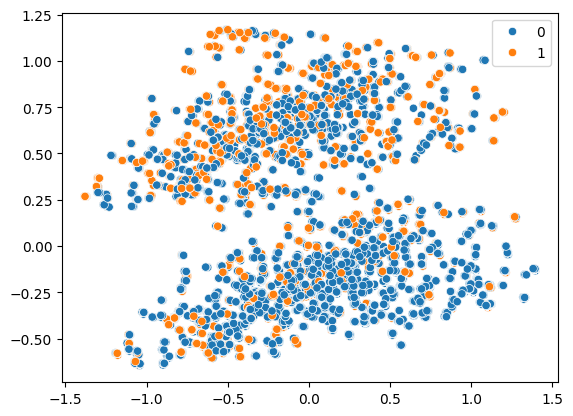

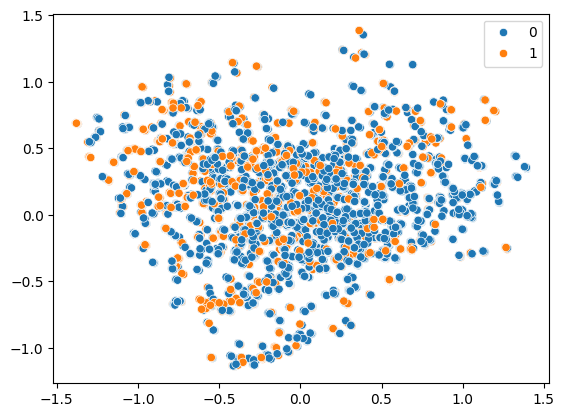

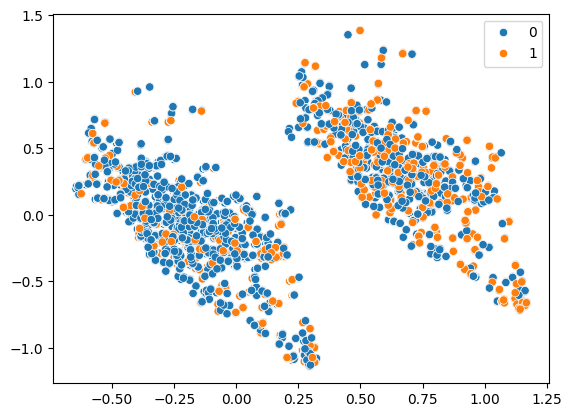

In [92]:
from sklearn.decomposition import PCA
pca_emb = PCA(n_components=3).fit_transform(X_transformed)
sns.scatterplot(x=pca_emb.T[0], y=pca_emb.T[1], hue = np.where(y_train == "Yes", 1, 0))
plt.show()
sns.scatterplot(x=pca_emb.T[0], y=pca_emb.T[2], hue = np.where(y_train == "Yes", 1, 0))
plt.show()
sns.scatterplot(x=pca_emb.T[1], y=pca_emb.T[2], hue = np.where(y_train == "Yes", 1, 0))
plt.show()

In [93]:
rains_embedded = TSNE(n_components=2, learning_rate='auto',init='random', perplexity=35, n_jobs=8).fit_transform(X_transformed)

<Axes: >

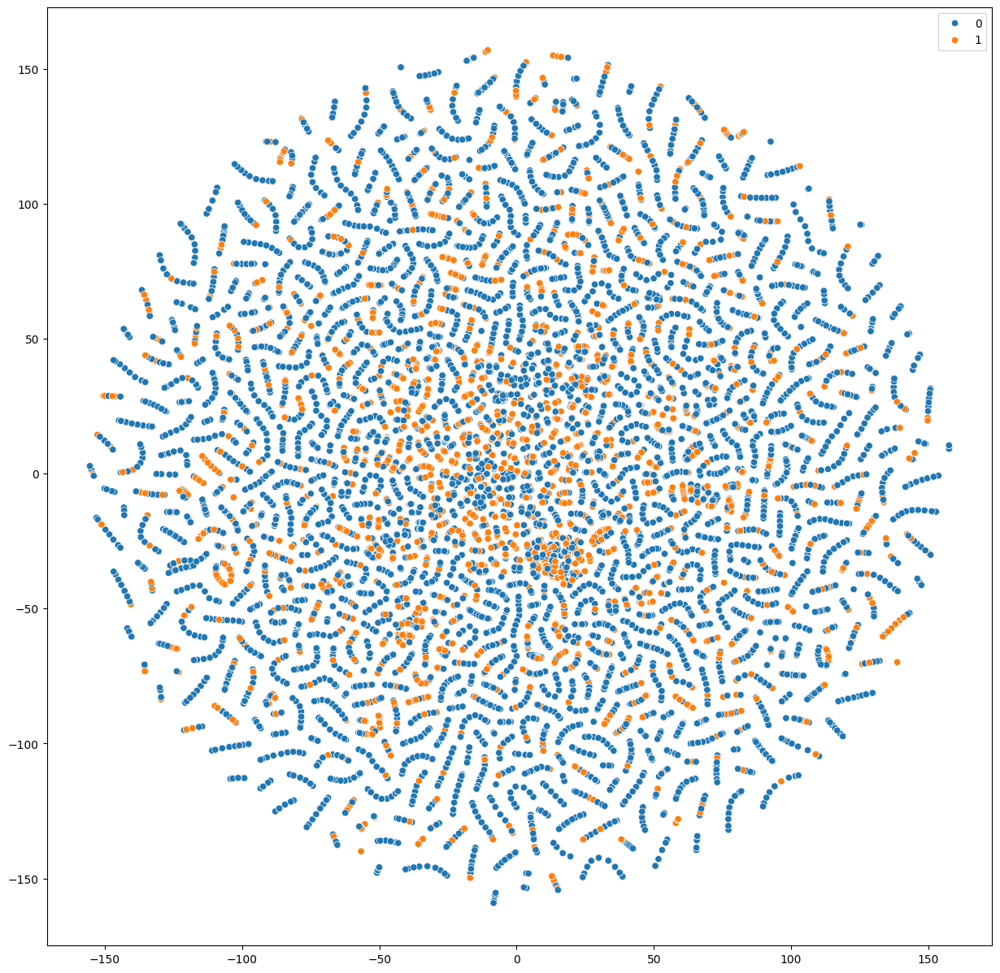

In [94]:
plt.figure(figsize=(15,15))
sns.scatterplot(x=rains_embedded.T[0],y=rains_embedded.T[1], hue=np.where(y_train == "Yes", 1, 0))